In [1]:
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from scipy import sparse
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import scanpy as sc
import spatialcorr
try:
    from pyriemann.geometry.base import logm, nearest_sym_pos_def
except ImportError:
    from pyriemann.utils.base import logm, nearest_sym_pos_def

MELANOMA_SAMPLE = "ST_mel1_rep2"
N_CLUSTERS = 3
N_NEIGHBORS=15
RIDGE=1e-6
TARGET_PRESERVED=0.50
LAMBDA_FOR_RANKING=0.5
LR=0.5
N_ITER=5000
N_PCS=20
# N_CLUSTERS=7
RANDOM_STATE=0
np.random.seed(RANDOM_STATE)


def dense(adata):
    X=adata.X.toarray() if sparse.issparse(adata.X) else np.asarray(adata.X)
    X=X.astype(float); X[~np.isfinite(X)]=0.0
    return X

def subset_genes(adata,genes):
    present=[g for g in genes if g in adata.var_names]
    missing=[g for g in genes if g not in adata.var_names]
    ad=adata[:,present].copy(); X=dense(ad); names=np.array(present)
    print("Requested:",len(genes),"Present:",len(present),"Missing:",len(missing),"Shape:",ad.shape)
    if missing: print("Missing:",missing)
    return ad,X,names

def coords_from(adata): return adata.obs[["row","col"]].to_numpy()

def neighbor_idx(adata,n_neighbors=N_NEIGHBORS):
    coords=coords_from(adata)
    nn=NearestNeighbors(n_neighbors=n_neighbors,metric="euclidean").fit(coords)
    return nn.kneighbors(return_distance=False)

def local_cov(X,nbr_idx,ridge=0.0):
    n,p=X.shape; out=np.empty((n,p,p),dtype=float); I=np.eye(p)
    for i in range(n):
        Z=X[nbr_idx[i],:]-X[nbr_idx[i],:].mean(axis=0,keepdims=True)
        C=(Z.T@Z)/max(len(nbr_idx[i])-1,1)+ridge*I
        out[i]=0.5*(C+C.T)
    return out

def local_corr(X,nbr_idx,eps=1e-12):
    C_mats=local_cov(X,nbr_idx,ridge=0.0)
    R=np.empty_like(C_mats)
    for i,C in enumerate(C_mats):
        sd=np.sqrt(np.maximum(np.diag(C),eps))
        M=C/np.outer(sd,sd)
        M=np.clip(M,-1,1); np.fill_diagonal(M,1.0)
        R[i]=0.5*(M+M.T)
    return R

def force_spd(mats, reg=RIDGE):
    mats = np.asarray(mats, dtype=float)
    mats = 0.5 * (mats + np.swapaxes(mats, -1, -2))
    I = np.eye(mats.shape[-1])
    mats = (1 - reg) * mats + reg * I
    try:
        return nearest_sym_pos_def(mats, reg=reg)
    except Exception:
        return np.stack([nearest_sym_pos_def(M, reg=reg) for M in mats])

def logeuclid_mats(mats, reg=RIDGE):
    return logm(force_spd(mats, reg=reg))

def logeuclid_features(log_mats):
    p = log_mats.shape[1]
    i, j = np.triu_indices(p)
    F = log_mats[:, i, j].copy()
    F[:, i != j] *= np.sqrt(2.0)
    return F

def assoc_variation(mats):
    A=mats-mats.mean(axis=0,keepdims=True)
    S=np.sum(A**2,axis=0)
    return 0.5*(S+S.T)

def kept_fraction(S_norm,w): return np.sum(S_norm*np.outer(w**2,w**2))

def optimize_weights(S_norm,lam=LAMBDA_FOR_RANKING,lr=LR,n_iter=N_ITER):
    p=S_norm.shape[0]; w=np.ones(p)
    for _ in range(n_iter):
        grad=4*w*(S_norm@(w**2)); w=w+lr*grad
        w=np.maximum(0,w-lr*lam/p); w=np.clip(w,0,1)
    return w

def preservation_path(S_norm,order,gene_names):
    rows=[]
    for k in range(1,len(gene_names)+1):
        ww=np.zeros(len(gene_names)); ww[order[:k]]=1.0
        rows.append({"k":k,"preserved_fraction":kept_fraction(S_norm,ww),"genes":", ".join(gene_names[order[:k]])})
    return pd.DataFrame(rows)

def corr_features(corr_mats):
    p=corr_mats.shape[1]
    i,j=np.triu_indices(p,k=1)
    return corr_mats[:,i,j].copy()

def relabel_by_position(raw,coords):
    cent=pd.DataFrame({"raw":raw,"row":coords[:,0],"col":coords[:,1]}).groupby("raw")[["row","col"]].mean()
    mapping={old:i+1 for i,old in enumerate(cent.sort_values(["row","col"]).index)}
    return np.array([mapping[x] for x in raw])

def run_variant(mode,prefix):
    nbr_idx=neighbor_idx(adata_g,N_NEIGHBORS)
    mats=local_corr(X,nbr_idx) if mode=="corr" else local_cov(X,nbr_idx,ridge=0.0)

    metric_mats = logeuclid_mats(mats, reg=RIDGE)
    S_raw = assoc_variation(metric_mats)
    S_norm=S_raw/S_raw.sum()
    weights=optimize_weights(S_norm)
    order=np.argsort(weights)[::-1]
    path=preservation_path(S_norm,order,gene_names)

    candidates=path[path["preserved_fraction"]>=TARGET_PRESERVED]
    chosen=candidates.iloc[0] if len(candidates) else path.iloc[-1]

    k_selected=int(chosen["k"])
    selected_idx=order[:k_selected]
    selected_genes=list(gene_names[selected_idx])

    ad=adata[:,selected_genes].copy()
    X_sel=dense(ad)
    coords_sel=coords_from(ad)
    nbr_sel=neighbor_idx(ad,N_NEIGHBORS)

    final_mats = local_corr(X_sel,nbr_sel) if mode=="corr" else local_cov(X_sel,nbr_sel,ridge=RIDGE)
    final_metric_mats = logeuclid_mats(final_mats, reg=RIDGE)
    F = logeuclid_features(final_metric_mats)
    Z=StandardScaler().fit_transform(F)

    n_components=min(N_PCS,Z.shape[0]-1,Z.shape[1])
    scores=PCA(n_components=n_components,random_state=RANDOM_STATE).fit_transform(Z)

    raw=KMeans(n_clusters=N_CLUSTERS,n_init=50,random_state=RANDOM_STATE).fit_predict(scores)
    clusters=relabel_by_position(raw,coords_sel)

    ad.obs[f"{prefix}_cluster"]=clusters.astype(int)
    ad.obs[f"{prefix}_PC1"]=scores[:,0]
    ad.obs[f"{prefix}_PC2"]=scores[:,1] if scores.shape[1]>1 else 0

    summary=pd.DataFrame([{
        "mode":mode,
        "target":TARGET_PRESERVED,
        "selected_genes":k_selected,
        "preserved_fraction":float(chosen["preserved_fraction"]),
        "genes":", ".join(selected_genes)
    }])

    return {
        "adata": ad,
        "path": path,
        "summary": summary,
        "selected_genes": selected_genes,
        "prefix": prefix,
        "embedding": scores
    }

/ocean/projects/bio250072p/mjian/conda_envs/spacoex311/lib/python3.11/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


In [2]:
from scipy.spatial import Delaunay
from scipy import sparse

FILTER_ARTIFACT_GENES = True
N_MORAN_CANDIDATES = 500
N_FEED_TO_SPACOEX = 200

def is_artifact_gene(g):
    g = str(g).upper()
    return (
        g.startswith("MT-") or
        g.startswith("RPL") or
        g.startswith("RPS") or
        g.startswith("HB") or
        g.startswith("IGH") or
        g.startswith("IGK") or
        g.startswith("IGL") or
        g == "MALAT1"
    )

def delaunay_adjacency(coords):
    coords = np.asarray(coords, dtype=float)
    tri = Delaunay(coords)

    edges = set()
    for simplex in tri.simplices:
        for a, b in [
            (simplex[0], simplex[1]),
            (simplex[0], simplex[2]),
            (simplex[1], simplex[2])
        ]:
            if a != b:
                edges.add((min(a, b), max(a, b)))

    rows, cols = [], []
    for a, b in edges:
        rows.extend([a, b])
        cols.extend([b, a])

    W = sparse.csr_matrix(
        (np.ones(len(rows)), (rows, cols)),
        shape=(coords.shape[0], coords.shape[0])
    )

    W.setdiag(0)
    W.eliminate_zeros()

    return W

def row_standardize(W):
    degree = np.asarray(W.sum(axis=1)).ravel()
    inv_degree = np.divide(
        1.0,
        degree,
        out=np.zeros_like(degree, dtype=float),
        where=degree > 0
    )
    return sparse.diags(inv_degree) @ W

def moran_scores(ad, chunk_size=512):
    X_all = ad.X
    W = row_standardize(delaunay_adjacency(ad.obsm["spatial"]))

    n, p = ad.shape
    scores = np.zeros(p)

    for start in range(0, p, chunk_size):
        end = min(start + chunk_size, p)
        X_chunk = X_all[:, start:end]

        if sparse.issparse(X_chunk):
            X_chunk = X_chunk.toarray()
        else:
            X_chunk = np.asarray(X_chunk)

        Z = X_chunk.astype(float)
        Z -= Z.mean(axis=0, keepdims=True)

        denom = np.sum(Z ** 2, axis=0)
        WZ = W @ Z
        numer = np.sum(Z * WZ, axis=0)

        scores[start:end] = np.divide(
            numer,
            denom,
            out=np.zeros_like(numer, dtype=float),
            where=denom > 0
        )

    return scores

def stew_style_candidates(
    ad,
    n_top=N_MORAN_CANDIDATES,
    moran_pool=N_MORAN_CANDIDATES,
    min_lisa_fraction=0.05,
    seed=0
):
    work = ad.copy()
    work.var_names_make_unique()

    if FILTER_ARTIFACT_GENES:
        keep_genes = [
            not is_artifact_gene(g)
            for g in work.var_names
        ]
        work = work[:, keep_genes].copy()

    I = moran_scores(work)

    table = pd.DataFrame({
        "gene": work.var_names.astype(str),
        "moran_I": I
    }).sort_values("moran_I", ascending=False)

    candidates = table.head(min(n_top, len(table)))["gene"].tolist()

    return candidates, table

In [3]:
SECTION1_SAMPLE_ID = "V1_Breast_Cancer_Block_A_Section_1"
LABEL_COLUMN = "fine_annot_type"

adata_raw = sc.datasets.visium_sge(sample_id=SECTION1_SAMPLE_ID)
adata_raw.var_names_make_unique()

meta = pd.read_csv(
    "https://raw.githubusercontent.com/JinmiaoChenLab/SEDR_analyses/master/data/BRCA1/metadata.tsv",
    sep="\t"
).set_index("ID")

adata_raw.obs = adata_raw.obs.join(meta, how="left")
adata_raw = adata_raw[adata_raw.obs[LABEL_COLUMN].notna()].copy()

adata_raw.obs["ground_truth"] = adata_raw.obs[LABEL_COLUMN].astype(str)
adata_raw.obs["row"] = adata_raw.obs["array_row"].astype(float)
adata_raw.obs["col"] = adata_raw.obs["array_col"].astype(float)

N_CLUSTERS = adata_raw.obs["ground_truth"].nunique()

print("spots:", adata_raw.n_obs)
print("genes:", adata_raw.n_vars)
print("clusters:", N_CLUSTERS)
display(adata_raw.obs["ground_truth"].value_counts().sort_index())

/var/tmp/ipykernel_84745/2701872120.py:4: FutureWarning: Use `squidpy.datasets.visium` instead.
  adata_raw = sc.datasets.visium_sge(sample_id=SECTION1_SAMPLE_ID)
/ocean/projects/bio250072p/mjian/conda_envs/spacoex311/lib/python3.11/site-packages/scanpy/datasets/_datasets.py:555: FutureWarning: Use `squidpy.read.visium` instead.
  return read_visium(sample_dir, source_image_path=source_image_path)
/ocean/projects/bio250072p/mjian/conda_envs/spacoex311/lib/python3.11/site-packages/anndata/_core/anndata.py:1884: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/ocean/projects/bio250072p/mjian/conda_envs/spacoex311/lib/python3.11/site-packages/anndata/_core/anndata.py:1884: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


spots: 3798
genes: 36601
clusters: 20


ground_truth
DCIS/LCIS_1     135
DCIS/LCIS_2      28
DCIS/LCIS_3     364
DCIS/LCIS_4     161
DCIS/LCIS_5     139
Healthy_1       411
Healthy_2        74
IDC_1            46
IDC_2           383
IDC_3            53
IDC_4           442
IDC_5           449
IDC_6           163
IDC_7           127
Tumor_edge_1    198
Tumor_edge_2    165
Tumor_edge_3    159
Tumor_edge_4     50
Tumor_edge_5     69
Tumor_edge_6    182
Name: count, dtype: int64

In [4]:
# NORMALIZE + MORAN RANKING + FEED TOP N INTO SpaCoEx

N_MORAN_RANKED = 500
N_FEED_TO_SPACOEX = 200

adata = adata_raw.copy()
adata.var_names_make_unique()

# Filter genes expressed in at least 50% of spots

MIN_FRACTION_EXPRESSED = 0.50
MIN_CELLS = int(np.ceil(MIN_FRACTION_EXPRESSED * adata.n_obs))

print("Filtering genes with min_cells:", MIN_CELLS)
print("Genes before filter:", adata.n_vars)

sc.pp.filter_genes(
    adata,
    min_cells=MIN_CELLS
)

print("Genes after 50% expression filter:", adata.n_vars)

adata.layers["counts"] = adata.X.copy()

sc.experimental.pp.normalize_pearson_residuals(
    adata,
    theta=100,
    clip=np.sqrt(adata.n_obs),
    inplace=True
)
if sparse.issparse(adata.X):
    adata.X = adata.X.toarray()

adata.X = np.asarray(adata.X, dtype=float)
adata.X[~np.isfinite(adata.X)] = 0.0

adata.obs["row"] = adata.obs["array_row"].astype(float)
adata.obs["col"] = adata.obs["array_col"].astype(float)

GENES_MORAN_500, breast_gene_table = stew_style_candidates(
    adata,
    n_top=N_MORAN_RANKED,
    moran_pool=N_MORAN_RANKED,
    min_lisa_fraction=0.05,
    seed=RANDOM_STATE
)

GENES_FOR_SPACOEX = GENES_MORAN_500[:N_FEED_TO_SPACOEX]

print("Moran-ranked genes:", len(GENES_MORAN_500))
print("Genes fed into SpaCoEx:", len(GENES_FOR_SPACOEX))

display(breast_gene_table.head(50))

adata_g, X, gene_names = subset_genes(adata, GENES_FOR_SPACOEX)

breast_corr_only = run_variant(
    mode="corr",
    prefix="Breast_CorrOnly"
)

display(breast_corr_only["summary"])

Filtering genes with min_cells: 1899
Genes before filter: 36601
Genes after 50% expression filter: 4688
Moran-ranked genes: 500
Genes fed into SpaCoEx: 200


,gene,moran_I
1496,CRISP3,0.878138
1218,CXCL14,0.865062
2511,MGP,0.836099
2563,KRT8,0.824579
4425,TTLL12,0.808438
1822,COX6C,0.807134
686,IGFBP5,0.798626
2413,CCND1,0.794255
2564,KRT18,0.771107
2205,GFRA1,0.768550


Requested: 200 Present: 200 Missing: 0 Shape: (3798, 200)


,mode,target,selected_genes,preserved_fraction,genes
0,corr,0.5,139,0.503832,"COPS9, MMP11, TRAC, KLHDC7B, FXYD3, VSTM2A, AC..."


In [5]:
# Compare SpaCoEx, expression-only, and joint features

from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from sklearn.neighbors import NearestNeighbors

truth = adata.obs["ground_truth"].astype(str).to_numpy()
coords = coords_from(adata)

C = np.asarray(breast_corr_only["embedding"])
coex_labels = breast_corr_only["adata"].obs["Breast_CorrOnly_cluster"].astype(str).to_numpy()

def expression_embedding_from_genes(ad, genes, n_components=20):
    b = ad[:, genes].copy()
    Xs = StandardScaler().fit_transform(dense(b))
    n_components = min(n_components, Xs.shape[0] - 1, Xs.shape[1])
    return PCA(n_components=n_components, random_state=RANDOM_STATE).fit_transform(Xs)

def expression_embedding_2000_hvg(ad, n_components=20):
    b = ad.copy()

    sc.pp.highly_variable_genes(
        b,
        n_top_genes=min(2000, b.n_vars),
        flavor="seurat"
    )

    b = b[:, b.var["highly_variable"]].copy()
    sc.pp.scale(b, max_value=10)

    sc.tl.pca(
        b,
        n_comps=min(n_components, b.n_obs - 1, b.n_vars - 1),
        random_state=RANDOM_STATE
    )

    return np.asarray(b.obsm["X_pca"])

def make_joint(E, C, alpha=0.5):
    E = StandardScaler().fit_transform(E)
    C = StandardScaler().fit_transform(C)

    Xj = np.hstack([
        np.sqrt(alpha) * E,
        np.sqrt(1.0 - alpha) * C
    ])

    n_components = min(20, Xj.shape[0] - 1, Xj.shape[1])

    return PCA(
        n_components=n_components,
        random_state=RANDOM_STATE
    ).fit_transform(Xj)

def cluster_embedding(Z):
    d = min(12, Z.shape[1])

    raw = KMeans(
        n_clusters=N_CLUSTERS,
        n_init=50,
        random_state=RANDOM_STATE
    ).fit_predict(Z[:, :d])

    return relabel_by_position(raw, coords).astype(str)

def evaluate_labels(name, labels):
    labels = np.asarray(labels).astype(str)

    nbr = (
        NearestNeighbors(n_neighbors=11)
        .fit(coords)
        .kneighbors(return_distance=False)[:, 1:]
    )

    different = np.sum(labels[nbr] != labels[:, None], axis=1)

    counts = pd.Series(labels).value_counts()
    prop = counts / counts.sum()

    return {
        "method": name,
        "n_clusters": len(np.unique(labels)),
        "ARI": adjusted_rand_score(truth, labels),
        "NMI": normalized_mutual_info_score(truth, labels),
        "PAS": np.mean(different >= 6),
        "largest_cluster_fraction": prop.max(),
        "smallest_cluster": counts.min()
    }

method_labels = {}
method_embeddings = {}

method_labels["Manual_annotation"] = truth

method_labels["SpaCoEx_coexpression"] = coex_labels
method_embeddings["SpaCoEx_coexpression"] = C

E_same = expression_embedding_from_genes(
    adata,
    breast_corr_only["selected_genes"]
)

method_embeddings["Expression_same_genes"] = E_same
method_labels["Expression_same_genes"] = cluster_embedding(E_same)

E_2000 = expression_embedding_2000_hvg(adata)

method_embeddings["Expression_2000HVG"] = E_2000
method_labels["Expression_2000HVG"] = cluster_embedding(E_2000)

for alpha in [0.25, 0.40, 0.50, 0.60, 0.75]:
    name = f"Joint_alpha_{alpha:.2f}"
    Z = make_joint(E_2000, C, alpha=alpha)

    method_embeddings[name] = Z
    method_labels[name] = cluster_embedding(Z)

benchmark_rows = [
    evaluate_labels(name, labels)
    for name, labels in method_labels.items()
    if name != "Manual_annotation"
]

breast_benchmark = pd.DataFrame(benchmark_rows).sort_values(
    ["ARI", "NMI"],
    ascending=False
)

display(breast_benchmark)

,method,n_clusters,ARI,NMI,PAS,largest_cluster_fraction,smallest_cluster
0,SpaCoEx_coexpression,20,0.439616,0.650748,0.047920,0.104002,65
3,Joint_alpha_0.25,20,0.422543,0.641149,0.066087,0.075303,79
4,Joint_alpha_0.40,20,0.417942,0.639616,0.085571,0.086625,76
6,Joint_alpha_0.60,20,0.412099,0.619836,0.173776,0.137177,56
5,Joint_alpha_0.50,20,0.406364,0.629705,0.126382,0.117430,64
7,Joint_alpha_0.75,20,0.392690,0.598247,0.236440,0.163507,35
2,Expression_2000HVG,20,0.336711,0.538939,0.443655,0.144023,62
1,Expression_same_genes,20,0.314199,0.534244,0.399947,0.208794,36


In [6]:
# EXTERNAL BASELINES FOR BREAST CANCER

import os
import pickle
import hashlib
import warnings

warnings.filterwarnings("ignore")

EXT_COMPONENTS = 12
FORCE_RERUN_EXTERNAL = False

CACHE_DIR = os.path.expanduser("~/Downloads/spacoex_cache")
os.makedirs(CACHE_DIR, exist_ok=True)

def short_hash(values):
    values = pd.Index(values).astype(str).to_list()
    txt = "|".join(values)
    return hashlib.md5(txt.encode("utf-8")).hexdigest()[:10]

def evaluate_external_method(name, labels, embedding=None):
    labels = np.asarray(labels).astype(str)

    nbr = (
        NearestNeighbors(n_neighbors=11)
        .fit(coords)
        .kneighbors(return_distance=False)[:, 1:]
    )

    different = np.sum(labels[nbr] != labels[:, None], axis=1)

    counts = pd.Series(labels).value_counts()
    prop = counts / counts.sum()

    row = {
        "method": name,
        "n_clusters": len(np.unique(labels)),
        "ARI": adjusted_rand_score(truth, labels),
        "NMI": normalized_mutual_info_score(truth, labels),
        "PAS": np.mean(different >= 6),
        "largest_cluster_fraction": prop.max(),
        "smallest_cluster": counts.min(),
        "has_embedding": embedding is not None
    }

    return row

def run_scanpy_pca_kmeans(ad, n_clusters=N_CLUSTERS, seed=RANDOM_STATE):
    b = ad.copy()

    sc.pp.highly_variable_genes(
        b,
        n_top_genes=min(2000, b.n_vars),
        flavor="seurat"
    )

    b = b[:, b.var["highly_variable"]].copy()
    sc.pp.scale(b, max_value=10)

    sc.tl.pca(
        b,
        n_comps=min(20, b.n_obs - 1, b.n_vars - 1),
        random_state=seed
    )

    emb = np.asarray(b.obsm["X_pca"])

    raw = KMeans(
        n_clusters=n_clusters,
        n_init=50,
        random_state=seed
    ).fit_predict(emb[:, :EXT_COMPONENTS])

    labels = relabel_by_position(raw, coords).astype(str)

    return labels, emb

def run_scanpy_leiden(ad, n_clusters=N_CLUSTERS, seed=RANDOM_STATE):
    b = ad.copy()

    sc.pp.highly_variable_genes(
        b,
        n_top_genes=min(2000, b.n_vars),
        flavor="seurat"
    )

    b = b[:, b.var["highly_variable"]].copy()
    sc.pp.scale(b, max_value=10)

    sc.tl.pca(
        b,
        n_comps=min(20, b.n_obs - 1, b.n_vars - 1),
        random_state=seed
    )

    sc.pp.neighbors(
        b,
        n_neighbors=15,
        n_pcs=20,
        random_state=seed
    )

    rows = []

    for res in np.round(np.arange(0.1, 3.1, 0.1), 2):
        key = f"leiden_{res}"

        sc.tl.leiden(
            b,
            resolution=float(res),
            random_state=seed,
            key_added=key
        )

        lab = b.obs[key].astype(str).to_numpy()

        rows.append({
            "resolution": float(res),
            "n_clusters": len(np.unique(lab)),
            "diff": abs(len(np.unique(lab)) - n_clusters),
            "key": key
        })

    res_table = pd.DataFrame(rows)
    best = res_table.sort_values(["diff", "resolution"]).iloc[0]

    print("Chosen Scanpy Leiden resolution:", best["resolution"])
    print("Scanpy Leiden clusters:", best["n_clusters"])

    return b.obs[best["key"]].astype(str).to_numpy(), np.asarray(b.obsm["X_pca"])

def run_spagcn_baseline(ad, n_clusters=N_CLUSTERS, seed=RANDOM_STATE):
    import random
    import torch
    import SpaGCN as spg

    b = ad.copy()

    x = b.obs["row"].tolist()
    y = b.obs["col"].tolist()

    adj = spg.calculate_adj_matrix(x=x, y=y, histology=False)

    spg.prefilter_genes(b, min_cells=3)
    spg.prefilter_specialgenes(b)

    sc.pp.normalize_total(b)
    sc.pp.log1p(b)

    num_pcs = min(30, b.n_obs, b.n_vars)

    p = 0.5
    l = spg.search_l(
        p,
        adj,
        start=0.01,
        end=1000,
        tol=0.01,
        max_run=100
    )

    def train_count(res, max_epochs=20):
        random.seed(seed)
        torch.manual_seed(seed)
        np.random.seed(seed)

        clf = spg.SpaGCN()
        clf.set_l(l)

        clf.train(
            b,
            adj,
            num_pcs=num_pcs,
            init_spa=True,
            init="louvain",
            res=res,
            tol=5e-3,
            lr=0.05,
            max_epochs=max_epochs
        )

        pred, _ = clf.predict()
        return len(set(pred)), pred

    rows = []

    for res in np.round(np.arange(0.2, 3.1, 0.1), 2):
        n_found, _ = train_count(float(res), max_epochs=20)

        rows.append({
            "res": float(res),
            "n_clusters": n_found,
            "diff": abs(n_found - n_clusters)
        })

    res_table = pd.DataFrame(rows)
    best = res_table.sort_values(["diff", "res"]).iloc[0]
    res = float(best["res"])

    print("Chosen SpaGCN resolution:", res)
    print("SpaGCN clusters:", int(best["n_clusters"]))

    random.seed(seed)
    torch.manual_seed(seed)
    np.random.seed(seed)

    clf = spg.SpaGCN()
    clf.set_l(l)

    clf.train(
        b,
        adj,
        num_pcs=num_pcs,
        init_spa=True,
        init="louvain",
        res=res,
        tol=5e-3,
        lr=0.05,
        max_epochs=200
    )

    pred, prob = clf.predict()

    return np.asarray(pred).astype(str), None

def run_stlearn_baseline(ad, n_clusters=N_CLUSTERS, seed=RANDOM_STATE):
    import stlearn as st

    b = ad.copy()

    st.pp.filter_genes(b, min_cells=1)
    st.pp.normalize_total(b)
    st.pp.log1p(b)
    st.pp.scale(b)

    n_comps = min(50, b.n_obs - 1, b.n_vars - 1)

    st.em.run_pca(b, n_comps=n_comps)

    st.tl.clustering.kmeans(
        b,
        n_clusters=n_clusters,
        use_data="X_pca",
        random_state=seed,
        key_added="stlearn_kmeans"
    )

    labels = b.obs["stlearn_kmeans"].astype(str).to_numpy()
    emb = np.asarray(b.obsm["X_pca"])

    return labels, emb

def run_graphst_baseline(ad, n_clusters=N_CLUSTERS, seed=RANDOM_STATE):
    import torch
    from GraphST import GraphST

    b = ad.copy()

    np.random.seed(seed)
    torch.manual_seed(seed)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = GraphST.GraphST(b, device=device)
    b = model.train()

    emb = np.asarray(b.obsm["emb"])

    raw = KMeans(
        n_clusters=n_clusters,
        n_init=50,
        random_state=seed
    ).fit_predict(emb)

    labels = relabel_by_position(raw, coords).astype(str)

    return labels, emb

external_methods = {
    "Scanpy_PCA_KMeans": run_scanpy_pca_kmeans,
    "Scanpy_Leiden": run_scanpy_leiden,
    "SpaGCN": run_spagcn_baseline,
    "stLearn": run_stlearn_baseline,
    "GraphST": run_graphst_baseline,
}

cache_id = (
    f"external_baselines_"
    f"nobs{adata.n_obs}_"
    f"nvars{adata.n_vars}_"
    f"k{N_CLUSTERS}_"
    f"seed{RANDOM_STATE}_"
    f"obs{short_hash(adata.obs_names)}_"
    f"var{short_hash(adata.var_names)}.pkl"
)

cache_path = os.path.join(CACHE_DIR, cache_id)

print("External baseline cache:")
print(cache_path)

if os.path.exists(cache_path) and not FORCE_RERUN_EXTERNAL:
    print("Loading cached external baseline results...")

    with open(cache_path, "rb") as f:
        cached = pickle.load(f)

    external_benchmark = cached["external_benchmark"]
    external_failures = cached["external_failures"]

    for name, labels in cached["method_labels_external"].items():
        method_labels[name] = labels

    for name, emb in cached["method_embeddings_external"].items():
        method_embeddings[name] = emb

else:
    print("No cache found, or FORCE_RERUN_EXTERNAL=True.")
    print("Running external baselines now...")

    external_rows = []
    external_failures_list = []
    method_labels_external = {}
    method_embeddings_external = {}

    for name, func in external_methods.items():
        print("\nRunning", name)

        try:
            labels, emb = func(adata)

            labels = np.asarray(labels).astype(str)
            method_labels[name] = labels
            method_labels_external[name] = labels

            if emb is not None:
                emb = np.asarray(emb)
                method_embeddings[name] = emb
                method_embeddings_external[name] = emb

            external_rows.append(
                evaluate_external_method(name, labels, embedding=emb)
            )

            print("Finished", name)

        except Exception as e:
            print("Skipped", name)
            print(type(e).__name__ + ":", e)

            external_failures_list.append({
                "method": name,
                "error_type": type(e).__name__,
                "error": str(e)
            })

    external_benchmark = pd.DataFrame(external_rows).sort_values(
        ["ARI", "NMI"],
        ascending=False
    )

    external_failures = pd.DataFrame(external_failures_list)

    cached = {
        "external_benchmark": external_benchmark,
        "external_failures": external_failures,
        "method_labels_external": method_labels_external,
        "method_embeddings_external": method_embeddings_external,
    }

    with open(cache_path, "wb") as f:
        pickle.dump(cached, f)

    print("Saved external baseline cache.")

print("External method benchmark")
display(external_benchmark)

print("Failures")
display(external_failures)

External baseline cache:
/jet/home/mjian/Downloads/spacoex_cache/external_baselines_nobs3798_nvars4688_k20_seed0_obs3c86c2a0ee_varf196ca4e56.pkl
Loading cached external baseline results...
External method benchmark


,method,n_clusters,ARI,NMI,PAS,largest_cluster_fraction,smallest_cluster,has_embedding
1,Scanpy_Leiden,18,0.522861,0.625089,0.242759,0.116114,41,True
0,Scanpy_PCA_KMeans,20,0.336711,0.538939,0.443655,0.144023,62,True


Failures


,method,error_type,error
0,SpaGCN,ModuleNotFoundError,No module named 'torch'
1,stLearn,ModuleNotFoundError,No module named 'stlearn'
2,GraphST,ModuleNotFoundError,No module named 'torch'


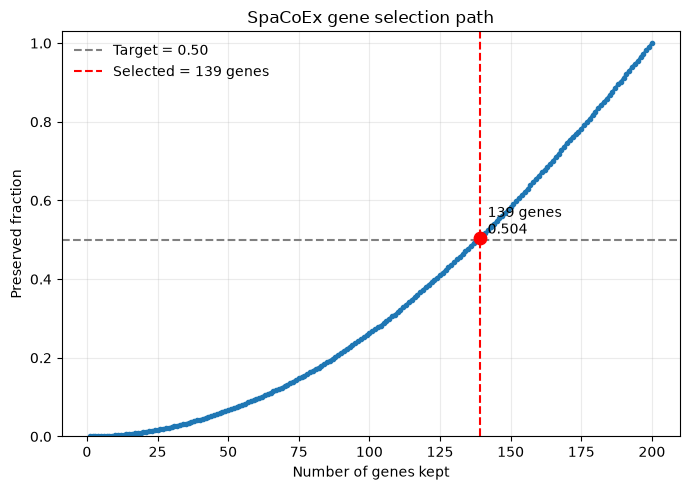

Saved figure to: /jet/home/mjian/Downloads/10x_breast_figures/spacoex_gene_selection_path.png


,selection_order,gene,selected_at_target
0,1,COPS9,True
1,2,MMP11,True
2,3,TRAC,True
3,4,KLHDC7B,True
4,5,FXYD3,True
...,...,...,...
195,196,TTLL12,False
196,197,KRT8,False
197,198,MGP,False
198,199,CXCL14,False


Saved gene order to: /jet/home/mjian/Downloads/10x_breast_figures/spacoex_gene_selection_order.csv


In [7]:
# ============================================================
# GENE SELECTION PATH
# Preserved fraction vs number of selected genes
# ============================================================

from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

OUT_DIR = Path.home() / "Downloads" / "10x_breast_figures"
OUT_DIR.mkdir(parents=True, exist_ok=True)

path = breast_corr_only["path"].copy()
summary = breast_corr_only["summary"].iloc[0]

selected_n = int(summary["selected_genes"])
selected_preserved = float(summary["preserved_fraction"])
target = float(summary["target"]) if "target" in summary else TARGET_PRESERVED

# ------------------------------------------------------------
# 1. Plot preserved-fraction path
# ------------------------------------------------------------

plt.figure(figsize=(7, 5))

plt.plot(
    path["k"],
    path["preserved_fraction"],
    marker="o",
    markersize=3,
    linewidth=2
)

plt.axhline(
    target,
    color="gray",
    linestyle="--",
    linewidth=1.5,
    label=f"Target = {target:.2f}"
)

plt.axvline(
    selected_n,
    color="red",
    linestyle="--",
    linewidth=1.5,
    label=f"Selected = {selected_n} genes"
)

plt.scatter(
    [selected_n],
    [selected_preserved],
    color="red",
    s=80,
    zorder=5
)

plt.text(
    selected_n,
    selected_preserved,
    f"  {selected_n} genes\n  {selected_preserved:.3f}",
    va="bottom",
    fontsize=10
)

plt.xlabel("Number of genes kept")
plt.ylabel("Preserved fraction")
plt.title("SpaCoEx gene selection path")
plt.ylim(0, 1.03)
plt.grid(alpha=0.25)
plt.legend(frameon=False)
plt.tight_layout()

out_path = OUT_DIR / "spacoex_gene_selection_path.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", out_path)

# ------------------------------------------------------------
# 2. Display genes in SpaCoEx selection order
# ------------------------------------------------------------

full_ordered_genes = [
    g.strip()
    for g in path.iloc[-1]["genes"].split(",")
]

selected_genes_ordered = [
    g.strip()
    for g in summary["genes"].split(",")
]

gene_selection_table = pd.DataFrame({
    "selection_order": np.arange(1, len(full_ordered_genes) + 1),
    "gene": full_ordered_genes,
    "selected_at_target": [
        g in selected_genes_ordered
        for g in full_ordered_genes
    ]
})

display(gene_selection_table)

gene_path = OUT_DIR / "spacoex_gene_selection_order.csv"
gene_selection_table.to_csv(gene_path, index=False)

print("Saved gene order to:", gene_path)

In [8]:
def check_gene_pipeline_status(
    gene,
    adata_raw,
    min_fraction_expressed=0.50,
    genes_moran=None,
    genes_for_spacoex=None,
    spacoex_result=None
):
    gene = str(gene)

    raw_ad = adata_raw.copy()
    raw_ad.var_names_make_unique()

    if gene not in raw_ad.var_names:
        print(f"{gene} was not found in adata_raw.var_names.")
        return None

    X_gene = raw_ad[:, [gene]].X

    if sparse.issparse(X_gene):
        expr = np.asarray(X_gene.toarray()).ravel()
    else:
        expr = np.asarray(X_gene).ravel()

    n_spots = raw_ad.n_obs
    n_expressing = int(np.sum(expr > 0))
    fraction_expressing = n_expressing / n_spots
    percent_expressing = 100 * fraction_expressing

    min_cells = int(np.ceil(min_fraction_expressed * n_spots))
    passes_expression_filter = n_expressing >= min_cells

    row = {
        "gene": gene,
        "n_spots": n_spots,
        "n_expressing_spots": n_expressing,
        "fraction_expressing_spots": fraction_expressing,
        "percent_expressing_spots": percent_expressing,
        "min_fraction_expressed": min_fraction_expressed,
        "min_cells_required": min_cells,
        "passes_expression_filter": passes_expression_filter,
        "moran_rank": None,
        "in_moran_ranked_list": None,
        "fed_to_spacoex": None,
        "spacoex_rank": None,
        "selected_by_spacoex": None,
    }

    if genes_moran is not None:
        genes_moran = list(map(str, genes_moran))
        row["in_moran_ranked_list"] = gene in genes_moran
        if gene in genes_moran:
            row["moran_rank"] = genes_moran.index(gene) + 1

    if genes_for_spacoex is not None:
        genes_for_spacoex = list(map(str, genes_for_spacoex))
        row["fed_to_spacoex"] = gene in genes_for_spacoex

    if spacoex_result is not None:
        full_spacoex_order = [
            g.strip()
            for g in spacoex_result["path"].iloc[-1]["genes"].split(",")
        ]

        selected_genes = list(map(str, spacoex_result["selected_genes"]))

        if gene in full_spacoex_order:
            row["spacoex_rank"] = full_spacoex_order.index(gene) + 1

        row["selected_by_spacoex"] = gene in selected_genes

    result_df = pd.DataFrame([row])
    display(result_df)

    print(f"Gene: {gene}")
    print(f"Expressed in {n_expressing}/{n_spots} spots ({percent_expressing:.2f}%).")
    print(f"Expression cutoff: {min_cells} spots ({100 * min_fraction_expressed:.1f}%).")
    print("Passes expression filter:", passes_expression_filter)

    if row["moran_rank"] is not None:
        print("Moran rank:", row["moran_rank"])
    elif genes_moran is not None:
        print("Not found in Moran-ranked list.")

    if row["fed_to_spacoex"] is not None:
        print("Fed to SpaCoEx:", row["fed_to_spacoex"])

    if row["spacoex_rank"] is not None:
        print("SpaCoEx rank:", row["spacoex_rank"])
    elif spacoex_result is not None:
        print("Not found in SpaCoEx ranking.")

    if row["selected_by_spacoex"] is not None:
        print("Selected by SpaCoEx:", row["selected_by_spacoex"])

    return result_df


# ============================================================
# FUNCTION: PLOT LOCAL CORRELATION MAP FOR ANY TWO GENES
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy import sparse

def plot_gene_pair_local_correlation(
    gene_a,
    gene_b,
    ad=None,
    n_neighbors=None,
    use_raw=False,
    point_size=8,
    cmap="coolwarm"
):
    """
    Plots local correlation map between two genes.

    Parameters
    ----------
    gene_a, gene_b : str
        Gene names.
    ad : AnnData or None
        AnnData to use. If None, uses adata by default, or adata_raw if use_raw=True.
    n_neighbors : int or None
        Number of spatial neighbors. If None, uses N_NEIGHBORS.
    use_raw : bool
        If True, use adata_raw. If False, use adata.
    """

    if n_neighbors is None:
        n_neighbors = N_NEIGHBORS

    if ad is None:
        if use_raw:
            ad = adata_raw.copy()
        else:
            ad = adata.copy()

    ad = ad.copy()
    ad.var_names_make_unique()

    missing = [g for g in [gene_a, gene_b] if g not in ad.var_names]
    if missing:
        raise ValueError(f"Missing genes from AnnData: {missing}")

    if "row" not in ad.obs.columns or "col" not in ad.obs.columns:
        if {"array_row", "array_col"}.issubset(ad.obs.columns):
            ad.obs["row"] = ad.obs["array_row"].astype(float)
            ad.obs["col"] = ad.obs["array_col"].astype(float)
        else:
            raise ValueError("Could not find row/col or array_row/array_col coordinates.")

    ad_pair = ad[:, [gene_a, gene_b]].copy()
    X_pair = ad_pair.X

    if sparse.issparse(X_pair):
        X_pair = X_pair.toarray()

    X_pair = np.asarray(X_pair, dtype=float)
    X_pair[~np.isfinite(X_pair)] = 0.0

    nbr = neighbor_idx(ad_pair, n_neighbors=n_neighbors)

    local_corr_values = np.zeros(ad_pair.n_obs, dtype=float)

    for i, idx in enumerate(nbr):
        xa = X_pair[idx, 0]
        xb = X_pair[idx, 1]

        if np.std(xa) < 1e-12 or np.std(xb) < 1e-12:
            local_corr_values[i] = 0.0
        else:
            local_corr_values[i] = np.corrcoef(xa, xb)[0, 1]

    local_corr_values[~np.isfinite(local_corr_values)] = 0.0

    x = ad_pair.obs["col"].astype(float).to_numpy()
    y = -ad_pair.obs["row"].astype(float).to_numpy()

    fig, ax = plt.subplots(figsize=(7, 5))

    sca = ax.scatter(
        x,
        y,
        c=local_corr_values,
        cmap=cmap,
        vmin=-1,
        vmax=1,
        s=point_size,
        linewidths=0
    )

    ax.set_title(f"Local correlation: {gene_a} vs {gene_b}")
    ax.set_aspect("equal")
    ax.axis("off")

    plt.colorbar(sca, ax=ax, label="Local correlation")
    plt.tight_layout()
    plt.show()

    summary = {
        "gene_a": gene_a,
        "gene_b": gene_b,
        "n_spots": ad_pair.n_obs,
        "mean_local_corr": float(np.mean(local_corr_values)),
        "sd_local_corr": float(np.std(local_corr_values)),
        "min_local_corr": float(np.min(local_corr_values)),
        "max_local_corr": float(np.max(local_corr_values)),
        "n_corr_exactly_1": int(np.sum(local_corr_values == 1.0)),
        "n_corr_exactly_minus_1": int(np.sum(local_corr_values == -1.0)),
        "n_corr_close_to_1": int(np.sum(np.isclose(local_corr_values, 1.0, atol=1e-12))),
        "n_corr_close_to_minus_1": int(np.sum(np.isclose(local_corr_values, -1.0, atol=1e-12))),
    }

    display(pd.DataFrame([summary]))

    return local_corr_values

In [9]:
check_gene_pipeline_status(
    gene="B2M",
    adata_raw=adata_raw,
    min_fraction_expressed=0.50,
    genes_moran=GENES_MORAN_500,
    genes_for_spacoex=GENES_FOR_SPACOEX,
    spacoex_result=breast_corr_only
)

check_gene_pipeline_status(
    gene="HLA-C",
    adata_raw=adata_raw,
    min_fraction_expressed=0.50,
    genes_moran=GENES_MORAN_500,
    genes_for_spacoex=GENES_FOR_SPACOEX,
    spacoex_result=breast_corr_only
)

,gene,n_spots,n_expressing_spots,fraction_expressing_spots,percent_expressing_spots,min_fraction_expressed,min_cells_required,passes_expression_filter,moran_rank,in_moran_ranked_list,fed_to_spacoex,spacoex_rank,selected_by_spacoex
0,B2M,3798,3797,0.999737,99.97367,0.5,1899,True,27,True,True,174,False


Gene: B2M
Expressed in 3797/3798 spots (99.97%).
Expression cutoff: 1899 spots (50.0%).
Passes expression filter: True
Moran rank: 27
Fed to SpaCoEx: True
SpaCoEx rank: 174
Selected by SpaCoEx: False


,gene,n_spots,n_expressing_spots,fraction_expressing_spots,percent_expressing_spots,min_fraction_expressed,min_cells_required,passes_expression_filter,moran_rank,in_moran_ranked_list,fed_to_spacoex,spacoex_rank,selected_by_spacoex
0,HLA-C,3798,3773,0.993418,99.341759,0.5,1899,True,36,True,True,165,False


Gene: HLA-C
Expressed in 3773/3798 spots (99.34%).
Expression cutoff: 1899 spots (50.0%).
Passes expression filter: True
Moran rank: 36
Fed to SpaCoEx: True
SpaCoEx rank: 165
Selected by SpaCoEx: False


,gene,n_spots,n_expressing_spots,fraction_expressing_spots,percent_expressing_spots,min_fraction_expressed,min_cells_required,passes_expression_filter,moran_rank,in_moran_ranked_list,fed_to_spacoex,spacoex_rank,selected_by_spacoex
0,HLA-C,3798,3773,0.993418,99.341759,0.5,1899,True,36,True,True,165,False


,target,selected_genes,actual_preserved_fraction,ARI,NMI,PAS
0,0.9,189,0.902338,0.443937,0.651471,0.048973
1,0.8,178,0.807655,0.485452,0.671237,0.042654
2,0.7,165,0.701471,0.463096,0.665276,0.042654
3,0.6,153,0.606846,0.431676,0.645332,0.050290
4,0.5,139,0.503832,0.439616,0.650748,0.047920


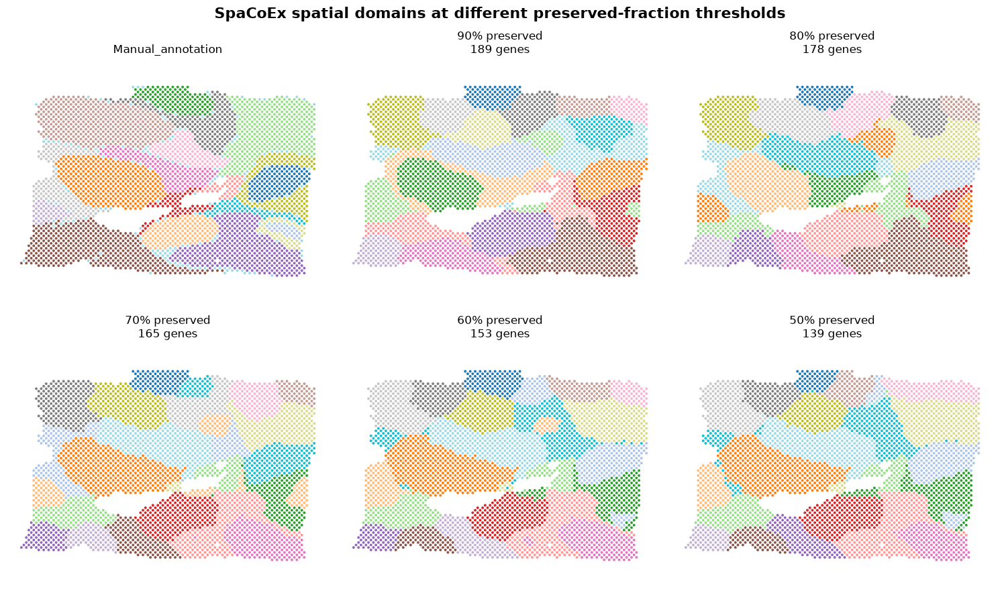

Saved figure to: /jet/home/mjian/Downloads/10x_breast_figures/spacoex_preserved_fraction_maps.png


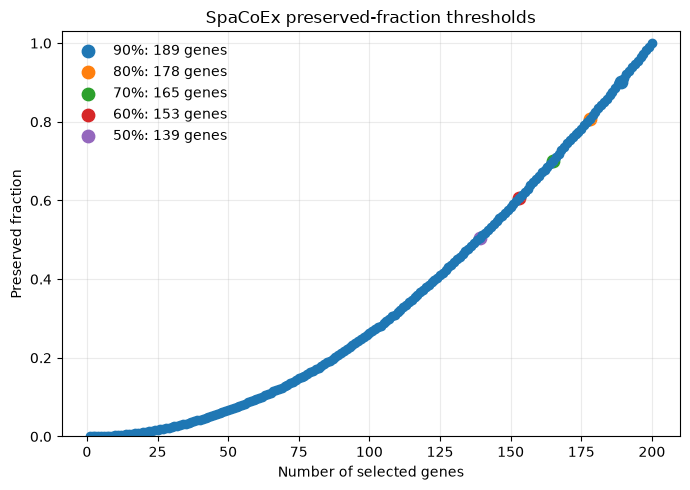

Saved curve to: /jet/home/mjian/Downloads/10x_breast_figures/spacoex_preserved_fraction_threshold_curve.png


In [10]:
# ============================================================
# SpaCoEx MAPS AT DIFFERENT PRESERVED-FRACTION THRESHOLDS
# 90%, 80%, 70%, etc.
# ============================================================

import math
import matplotlib.pyplot as plt

PRESERVED_TARGETS = [0.90, 0.80, 0.70, 0.60, 0.50]

def run_spacoex_at_preserved_fraction(target, prefix):
    path0 = breast_corr_only["path"].copy()

    candidates = path0[path0["preserved_fraction"] >= target]

    if len(candidates):
        chosen = candidates.iloc[0]
    else:
        chosen = path0.iloc[-1]

    k_selected = int(chosen["k"])

    # Reuse the original SpaCoEx ranking from breast_corr_only
    order0 = np.asarray(breast_corr_only["path"].index)
    selected_gene_string = chosen["genes"]
    selected_genes = [g.strip() for g in selected_gene_string.split(",")]

    ad = adata[:, selected_genes].copy()
    X_sel = dense(ad)
    coords_sel = coords_from(ad)
    nbr_sel = neighbor_idx(ad, N_NEIGHBORS)

    final_mats = local_corr(X_sel, nbr_sel)
    final_metric_mats = logeuclid_mats(final_mats, reg=RIDGE)
    F = logeuclid_features(final_metric_mats)

    Z = StandardScaler().fit_transform(F)

    n_components = min(N_PCS, Z.shape[0] - 1, Z.shape[1])
    scores = PCA(
        n_components=n_components,
        random_state=RANDOM_STATE
    ).fit_transform(Z)

    raw = KMeans(
        n_clusters=N_CLUSTERS,
        n_init=50,
        random_state=RANDOM_STATE
    ).fit_predict(scores)

    clusters = relabel_by_position(raw, coords_sel)

    ad.obs[f"{prefix}_cluster"] = clusters.astype(int)

    summary = {
        "target": target,
        "selected_genes": k_selected,
        "actual_preserved_fraction": float(chosen["preserved_fraction"]),
        "prefix": prefix,
        "labels": clusters.astype(str),
        "embedding": scores,
        "genes": selected_genes
    }

    return summary

preserved_results = []

for target in PRESERVED_TARGETS:
    prefix = f"SpaCoEx_preserved_{int(target * 100)}"
    res = run_spacoex_at_preserved_fraction(target, prefix)
    preserved_results.append(res)

preserved_summary = pd.DataFrame([
    {
        "target": r["target"],
        "selected_genes": r["selected_genes"],
        "actual_preserved_fraction": r["actual_preserved_fraction"],
        "ARI": adjusted_rand_score(truth, r["labels"]),
        "NMI": normalized_mutual_info_score(truth, r["labels"]),
        "PAS": evaluate_labels(r["prefix"], r["labels"])["PAS"]
    }
    for r in preserved_results
]).sort_values("target", ascending=False)

display(preserved_summary)

# Save labels into method_labels/method_embeddings too
for r in preserved_results:
    method_labels[r["prefix"]] = r["labels"]
    method_embeddings[r["prefix"]] = r["embedding"]

# ------------------------------------------------------------
# Plot maps
# ------------------------------------------------------------

plot_items = [("Manual_annotation", truth)]

for r in preserved_results:
    label = (
        f"{int(r['target'] * 100)}% preserved\n"
        f"{r['selected_genes']} genes"
    )
    plot_items.append((label, r["labels"]))

n_cols = 3
n_rows = math.ceil(len(plot_items) / n_cols)

fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(5 * n_cols, 4.5 * n_rows)
)

axes = np.asarray(axes).reshape(-1)

for ax, (title, labels) in zip(axes, plot_items):
    labels = np.asarray(labels).astype(str)
    codes = pd.Categorical(labels).codes

    ax.scatter(
        coords[:, 1],
        coords[:, 0],
        c=codes,
        cmap="tab20",
        s=8,
        linewidths=0
    )

    ax.set_title(title)
    ax.invert_yaxis()
    ax.axis("equal")
    ax.axis("off")

for ax in axes[len(plot_items):]:
    ax.axis("off")

fig.suptitle("SpaCoEx spatial domains at different preserved-fraction thresholds", fontsize=16, fontweight="bold")
plt.tight_layout()

out_path = OUT_DIR / "spacoex_preserved_fraction_maps.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure to:", out_path)

# ------------------------------------------------------------
# Plot preserved-fraction curve with chosen thresholds
# ------------------------------------------------------------

path0 = breast_corr_only["path"].copy()

plt.figure(figsize=(7, 5))

plt.plot(
    path0["k"],
    path0["preserved_fraction"],
    marker="o",
    linewidth=2
)

for r in preserved_results:
    plt.scatter(
        r["selected_genes"],
        r["actual_preserved_fraction"],
        s=80,
        label=f"{int(r['target'] * 100)}%: {r['selected_genes']} genes"
    )

plt.xlabel("Number of selected genes")
plt.ylabel("Preserved fraction")
plt.title("SpaCoEx preserved-fraction thresholds")
plt.ylim(0, 1.03)
plt.grid(alpha=0.25)
plt.legend(frameon=False)
plt.tight_layout()

curve_path = OUT_DIR / "spacoex_preserved_fraction_threshold_curve.png"
plt.savefig(curve_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved curve to:", curve_path)

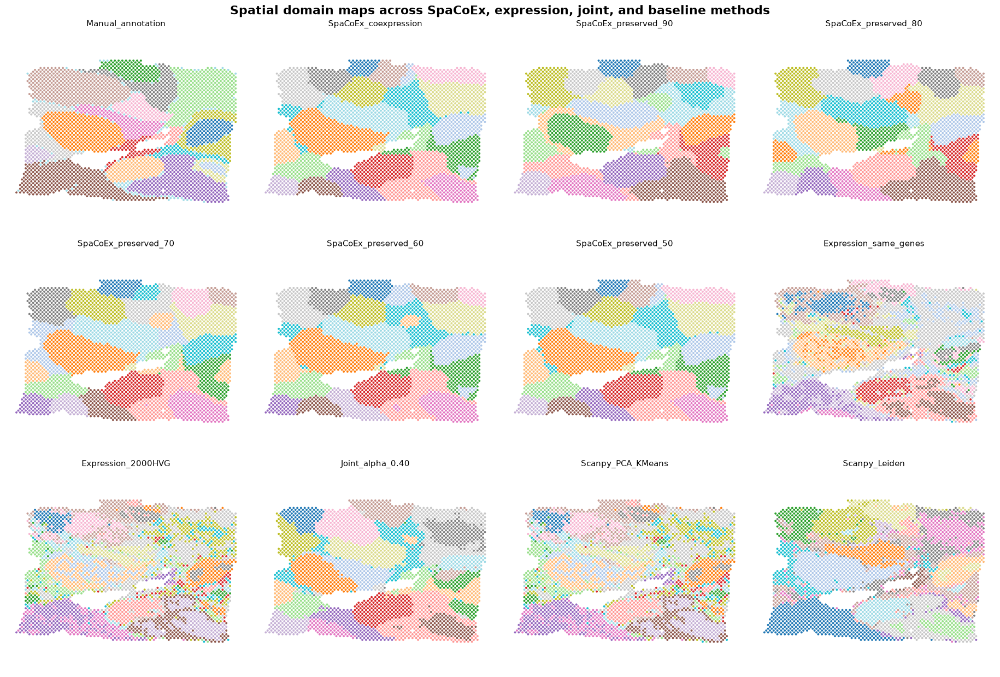

Saved combined map figure to: /jet/home/mjian/Downloads/10x_breast_figures/combined_method_spatial_maps_with_preserved_thresholds.png


,method,n_clusters,ARI,NMI,PAS,largest_cluster_fraction,smallest_cluster
9,Scanpy_Leiden,18,0.522861,0.625089,0.242759,0.116114,41
11,SpaCoEx_preserved_80,20,0.485452,0.671237,0.042654,0.097156,68
12,SpaCoEx_preserved_70,20,0.463096,0.665276,0.042654,0.100316,64
10,SpaCoEx_preserved_90,20,0.443937,0.651471,0.048973,0.099526,67
0,SpaCoEx_coexpression,20,0.439616,0.650748,0.047920,0.104002,65
14,SpaCoEx_preserved_50,20,0.439616,0.650748,0.047920,0.104002,65
13,SpaCoEx_preserved_60,20,0.431676,0.645332,0.050290,0.106898,64
3,Joint_alpha_0.25,20,0.422543,0.641149,0.066087,0.075303,79
4,Joint_alpha_0.40,20,0.417942,0.639616,0.085571,0.086625,76
6,Joint_alpha_0.60,20,0.412099,0.619836,0.173776,0.137177,56


Saved combined benchmark table to: /jet/home/mjian/Downloads/10x_breast_figures/combined_benchmark_with_preserved_thresholds.csv


In [11]:
# ============================================================
# COMBINED METHOD MAPS
# Manual annotation + SpaCoEx preserved thresholds
# + expression-only + joint + external baselines
# ============================================================

import math
import matplotlib.pyplot as plt

# Choose which joint alpha to show
JOINT_TO_SHOW = "Joint_alpha_0.40"

preferred_order = [
    "Manual_annotation",
    "SpaCoEx_coexpression",
    "SpaCoEx_preserved_90",
    "SpaCoEx_preserved_80",
    "SpaCoEx_preserved_70",
    "SpaCoEx_preserved_60",
    "SpaCoEx_preserved_50",
    "Expression_same_genes",
    "Expression_2000HVG",
    JOINT_TO_SHOW,
    "Scanpy_PCA_KMeans",
    "Scanpy_Leiden",
    "stLearn",
    "GraphST",
    "SpaGCN",
]

plot_order = [m for m in preferred_order if m in method_labels]

n_cols = 4
n_rows = math.ceil(len(plot_order) / n_cols)

fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(4.6 * n_cols, 4.2 * n_rows)
)

axes = np.asarray(axes).reshape(-1)

for ax, method in zip(axes, plot_order):
    labels = np.asarray(method_labels[method]).astype(str)
    codes = pd.Categorical(labels).codes

    ax.scatter(
        coords[:, 1],
        coords[:, 0],
        c=codes,
        cmap="tab20",
        s=8,
        linewidths=0
    )

    ax.set_title(method, fontsize=11)
    ax.invert_yaxis()
    ax.axis("equal")
    ax.axis("off")

for ax in axes[len(plot_order):]:
    ax.axis("off")

fig.suptitle("Spatial domain maps across SpaCoEx, expression, joint, and baseline methods", fontsize=16, fontweight="bold")
plt.tight_layout()

out_path = OUT_DIR / "combined_method_spatial_maps_with_preserved_thresholds.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved combined map figure to:", out_path)

# ------------------------------------------------------------
# Combined benchmark table including preserved-threshold methods
# ------------------------------------------------------------

combined_rows = []

for name, labels in method_labels.items():
    if name == "Manual_annotation":
        continue

    combined_rows.append(
        evaluate_labels(name, labels)
    )

combined_benchmark = pd.DataFrame(combined_rows).sort_values(
    ["ARI", "NMI"],
    ascending=False
)

display(combined_benchmark)

combined_table_path = OUT_DIR / "combined_benchmark_with_preserved_thresholds.csv"
combined_benchmark.to_csv(combined_table_path, index=False)

print("Saved combined benchmark table to:", combined_table_path)

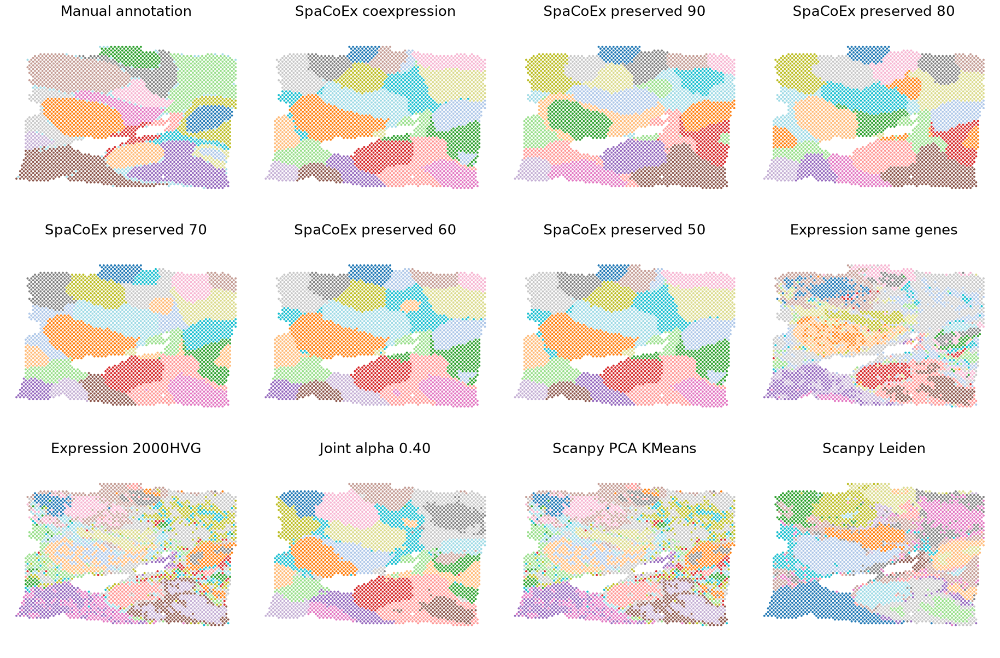

Saved combined map figure to: /jet/home/mjian/Downloads/10x_breast_figures/combined_method_spatial_maps_with_preserved_thresholds.png


,method,n_clusters,ARI,NMI,PAS,largest_cluster_fraction,smallest_cluster
9,Scanpy Leiden,18,0.522861,0.625089,0.242759,0.116114,41
11,SpaCoEx preserved 80,20,0.485452,0.671237,0.042654,0.097156,68
12,SpaCoEx preserved 70,20,0.463096,0.665276,0.042654,0.100316,64
10,SpaCoEx preserved 90,20,0.443937,0.651471,0.048973,0.099526,67
0,SpaCoEx coexpression,20,0.439616,0.650748,0.047920,0.104002,65
14,SpaCoEx preserved 50,20,0.439616,0.650748,0.047920,0.104002,65
13,SpaCoEx preserved 60,20,0.431676,0.645332,0.050290,0.106898,64
3,Joint alpha 0.25,20,0.422543,0.641149,0.066087,0.075303,79
4,Joint alpha 0.40,20,0.417942,0.639616,0.085571,0.086625,76
6,Joint alpha 0.60,20,0.412099,0.619836,0.173776,0.137177,56


Saved combined benchmark table to: /jet/home/mjian/Downloads/10x_breast_figures/combined_benchmark_with_preserved_thresholds.csv


In [12]:
# ============================================================
# COMBINED METHOD MAPS
# ============================================================

import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

JOINT_TO_SHOW = "Joint_alpha_0.40"

# Font settings; figure dimensions remain unchanged
PANEL_TITLE_SIZE = 19
FIGURE_TITLE_SIZE = 25

preferred_order = [
    "Manual_annotation",
    "SpaCoEx_coexpression",
    "SpaCoEx_preserved_90",
    "SpaCoEx_preserved_80",
    "SpaCoEx_preserved_70",
    "SpaCoEx_preserved_60",
    "SpaCoEx_preserved_50",
    "Expression_same_genes",
    "Expression_2000HVG",
    JOINT_TO_SHOW,
    "Scanpy_PCA_KMeans",
    "Scanpy_Leiden",
    "stLearn",
    "GraphST",
    "SpaGCN",
]

plot_order = [
    method
    for method in preferred_order
    if method in method_labels
]

n_cols = 4
n_rows = math.ceil(len(plot_order) / n_cols)

# Same figure size as before
fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(4.6 * n_cols, 4.2 * n_rows)
)

axes = np.asarray(axes).reshape(-1)

for ax, method in zip(axes, plot_order):
    labels = np.asarray(
        method_labels[method]
    ).astype(str)

    codes = pd.Categorical(labels).codes

    ax.scatter(
        coords[:, 1],
        coords[:, 0],
        c=codes,
        cmap="tab20",
        s=8,
        linewidths=0
    )

    # Replace underscores with spaces for display only
    display_name = method.replace("_", " ")

    ax.set_title(
        display_name,
        fontsize=PANEL_TITLE_SIZE,
        # fontweight="bold",
        pad=3,
        wrap=True
    )

    ax.invert_yaxis()
    ax.axis("equal")
    ax.axis("off")

for ax in axes[len(plot_order):]:
    ax.axis("off")

# fig.suptitle(
#     "Spatial domain maps across SpaCoEx, expression, joint, and baseline methods",
#     fontsize=FIGURE_TITLE_SIZE,
#     fontweight="bold",
#     y=0.995
# )

# Reserve room for the larger main title
plt.tight_layout(
    rect=[0, 0, 1, 0.965]
)

out_path = (
    OUT_DIR
    / "combined_method_spatial_maps_with_preserved_thresholds.png"
)

plt.savefig(
    out_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("Saved combined map figure to:", out_path)


# ------------------------------------------------------------
# Combined benchmark table
# ------------------------------------------------------------

combined_rows = []

for name, labels in method_labels.items():
    if name == "Manual_annotation":
        continue

    combined_rows.append(
        evaluate_labels(name, labels)
    )

combined_benchmark = pd.DataFrame(
    combined_rows
).sort_values(
    ["ARI", "NMI"],
    ascending=False
)

# Readable displayed copy without changing internal method names
display_benchmark = combined_benchmark.copy()
display_benchmark["method"] = (
    display_benchmark["method"]
    .str.replace("_", " ", regex=False)
)

display(display_benchmark)

combined_table_path = (
    OUT_DIR
    / "combined_benchmark_with_preserved_thresholds.csv"
)

combined_benchmark.to_csv(
    combined_table_path,
    index=False
)

print(
    "Saved combined benchmark table to:",
    combined_table_path
)

,method,task,accuracy,balanced_accuracy,precision,recall,f1,jaccard,specificity,true_positive,false_positive,true_negative,false_negative,predicted_cancer_fraction
24,Scanpy_Leiden,Expanded: IDC + DCIS/LCIS + tumor edge,0.928120,0.907758,0.981622,0.935104,0.957799,0.919015,0.880412,3098,58,427,215,0.830964
19,Joint_alpha_0.40,Expanded: IDC + DCIS/LCIS + tumor edge,0.949710,0.906054,0.977370,0.964685,0.970986,0.943608,0.847423,3196,74,411,117,0.860979
26,SpaCoEx_preserved_80,Expanded: IDC + DCIS/LCIS + tumor edge,0.957083,0.901479,0.974684,0.976155,0.975418,0.952016,0.826804,3234,84,401,79,0.873618
25,SpaCoEx_preserved_90,Expanded: IDC + DCIS/LCIS + tumor edge,0.944708,0.900546,0.976359,0.959855,0.968037,0.938053,0.841237,3180,77,408,133,0.857557
18,Joint_alpha_0.25,Expanded: IDC + DCIS/LCIS + tumor edge,0.949710,0.881413,0.969333,0.973136,0.971231,0.944070,0.789691,3224,102,383,89,0.875724
27,SpaCoEx_preserved_70,Expanded: IDC + DCIS/LCIS + tumor edge,0.953923,0.873268,0.966132,0.981588,0.973798,0.948935,0.764948,3252,114,371,61,0.886256
15,SpaCoEx_coexpression,Expanded: IDC + DCIS/LCIS + tumor edge,0.952607,0.872513,0.966082,0.980078,0.973030,0.947476,0.764948,3247,114,371,66,0.884939
29,SpaCoEx_preserved_50,Expanded: IDC + DCIS/LCIS + tumor edge,0.952607,0.872513,0.966082,0.980078,0.973030,0.947476,0.764948,3247,114,371,66,0.884939
28,SpaCoEx_preserved_60,Expanded: IDC + DCIS/LCIS + tumor edge,0.948657,0.850009,0.959611,0.982493,0.970917,0.943478,0.717526,3255,137,348,58,0.893102
20,Joint_alpha_0.50,Expanded: IDC + DCIS/LCIS + tumor edge,0.921801,0.726375,0.926471,0.988832,0.956636,0.916877,0.463918,3276,260,225,37,0.931016


Saved binary cancer evaluation to: /jet/home/mjian/Downloads/10x_breast_figures/binary_cancer_evaluation_all_methods.csv


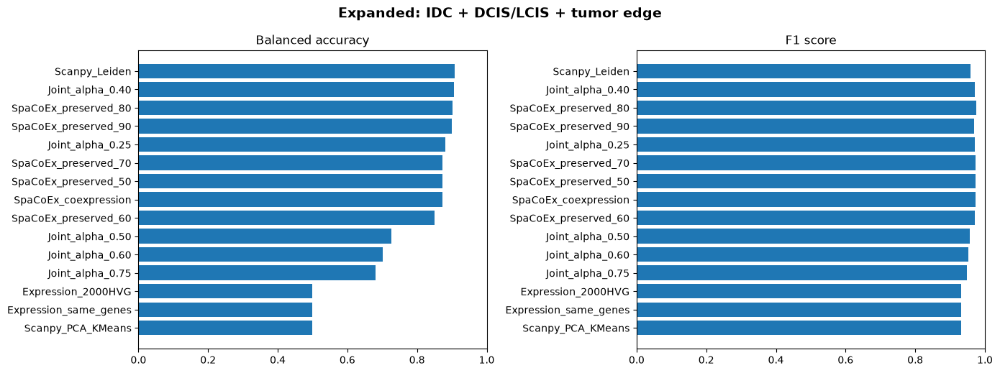

Saved figure to: /jet/home/mjian/Downloads/10x_breast_figures/binary_cancer_metrics_Expanded_IDC_plus_DCIS_LCIS_plus_tumor_edge.png


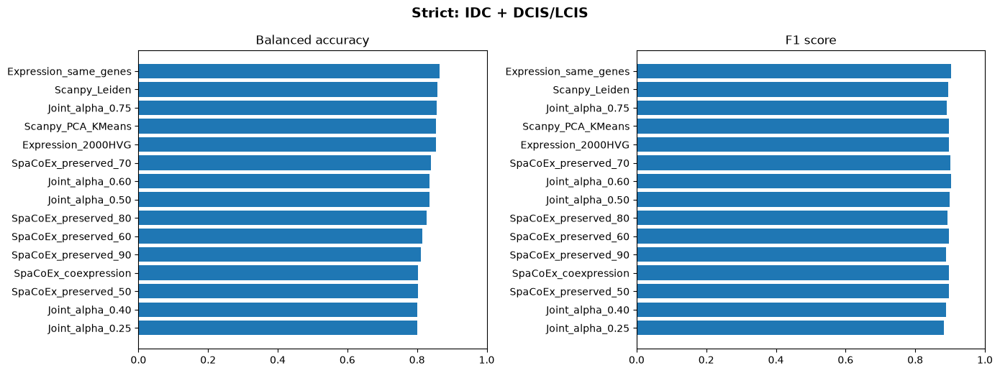

Saved figure to: /jet/home/mjian/Downloads/10x_breast_figures/binary_cancer_metrics_Strict_IDC_plus_DCIS_LCIS.png


In [13]:
# ============================================================
# BINARY CANCER EVALUATION FOR ALL METHODS
# Strict and expanded cancer definitions
# ============================================================

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    jaccard_score,
    confusion_matrix
)
from scipy.optimize import linear_sum_assignment

def manual_binary_labels(mode="strict"):
    fine = pd.Series(truth).astype(str)

    if mode == "strict":
        # Cancer = IDC + DCIS/LCIS
        cancer = fine.str.startswith(("IDC", "DCIS/LCIS"))
        task_name = "Strict: IDC + DCIS/LCIS"
    elif mode == "expanded":
        # Cancer = IDC + DCIS/LCIS + Tumor_edge
        cancer = fine.str.startswith(("IDC", "DCIS/LCIS", "Tumor_edge"))
        task_name = "Expanded: IDC + DCIS/LCIS + tumor edge"
    else:
        raise ValueError("mode must be 'strict' or 'expanded'")

    return cancer.to_numpy().astype(int), task_name

def cluster_labels_to_binary(labels, y_true):
    """
    Converts multiclass cluster labels to binary cancer/non-cancer labels.

    Each cluster is assigned to cancer or non-cancer based on majority overlap
    with the manual binary label.
    """
    labels = np.asarray(labels).astype(str)
    y_true = np.asarray(y_true).astype(int)

    pred = np.zeros(len(labels), dtype=int)

    for cluster in np.unique(labels):
        mask = labels == cluster

        if y_true[mask].mean() >= 0.5:
            pred[mask] = 1
        else:
            pred[mask] = 0

    return pred

def binary_metrics_for_method(method, labels, y_true, task_name):
    y_pred = cluster_labels_to_binary(labels, y_true)

    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()

    return {
        "method": method,
        "task": task_name,
        "accuracy": accuracy_score(y_true, y_pred),
        "balanced_accuracy": balanced_accuracy_score(y_true, y_pred),
        "precision": precision_score(y_true, y_pred, zero_division=0),
        "recall": recall_score(y_true, y_pred, zero_division=0),
        "f1": f1_score(y_true, y_pred, zero_division=0),
        "jaccard": jaccard_score(y_true, y_pred, zero_division=0),
        "specificity": tn / (tn + fp) if (tn + fp) > 0 else np.nan,
        "true_positive": tp,
        "false_positive": fp,
        "true_negative": tn,
        "false_negative": fn,
        "predicted_cancer_fraction": y_pred.mean()
    }

binary_rows = []

for mode in ["strict", "expanded"]:
    y_true_binary, task_name = manual_binary_labels(mode)

    for method, labels in method_labels.items():
        if method == "Manual_annotation":
            continue

        binary_rows.append(
            binary_metrics_for_method(
                method=method,
                labels=labels,
                y_true=y_true_binary,
                task_name=task_name
            )
        )

binary_cancer_table = pd.DataFrame(binary_rows).sort_values(
    ["task", "balanced_accuracy", "f1"],
    ascending=[True, False, False]
)

display(binary_cancer_table)

binary_path = OUT_DIR / "binary_cancer_evaluation_all_methods.csv"
binary_cancer_table.to_csv(binary_path, index=False)

print("Saved binary cancer evaluation to:", binary_path)

# ------------------------------------------------------------
# Plot balanced accuracy and F1
# ------------------------------------------------------------

for task_name in binary_cancer_table["task"].unique():
    plot_df = binary_cancer_table[
        binary_cancer_table["task"] == task_name
    ].sort_values("balanced_accuracy", ascending=True)

    fig, axes = plt.subplots(1, 2, figsize=(14, max(5, 0.35 * len(plot_df))))

    axes[0].barh(plot_df["method"], plot_df["balanced_accuracy"])
    axes[0].set_title("Balanced accuracy")
    axes[0].set_xlim(0, 1)

    axes[1].barh(plot_df["method"], plot_df["f1"])
    axes[1].set_title("F1 score")
    axes[1].set_xlim(0, 1)

    fig.suptitle(task_name, fontsize=14, fontweight="bold")
    plt.tight_layout()

    safe_task = (
        task_name.replace(":", "")
        .replace("+", "plus")
        .replace("/", "_")
        .replace(" ", "_")
    )

    out_path = OUT_DIR / f"binary_cancer_metrics_{safe_task}.png"
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.show()

    print("Saved figure to:", out_path)

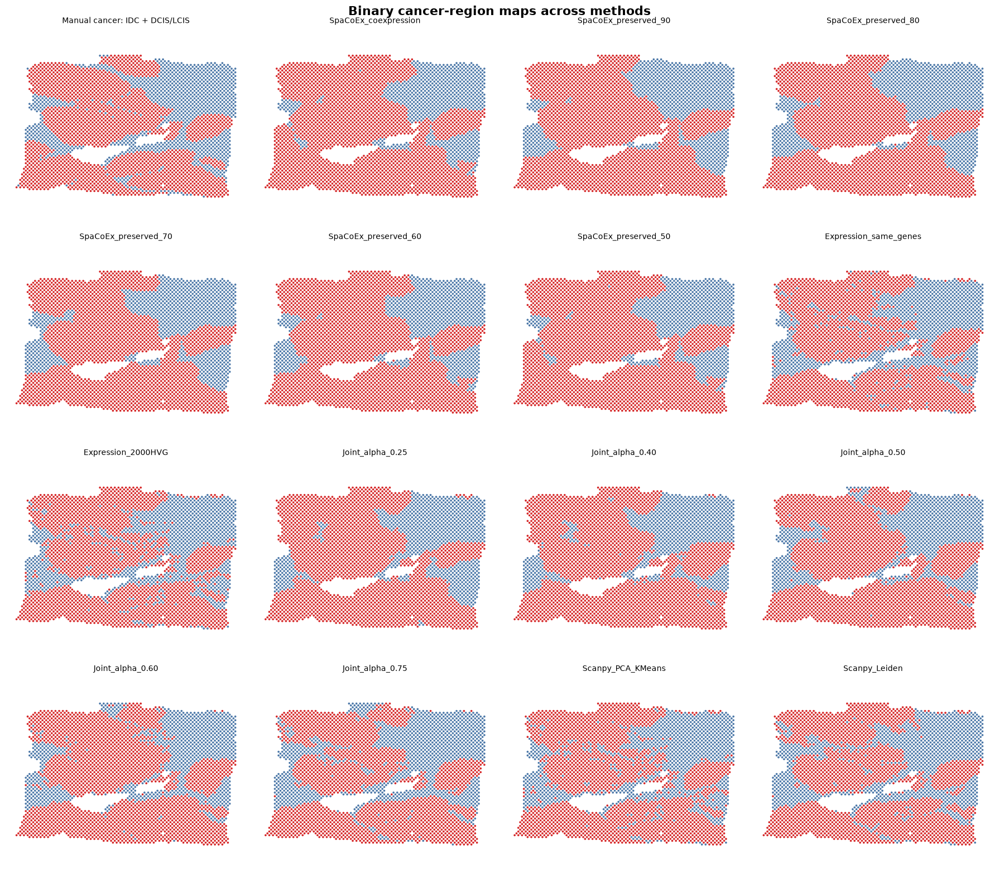

Saved: /jet/home/mjian/Downloads/10x_breast_figures/binary_cancer_maps_all_methods_strict.png
Saved: /jet/home/mjian/Downloads/10x_breast_figures/binary_cancer_maps_all_methods_strict.pdf


In [14]:
# BINARY CANCER MAPS FOR ALL METHODS
# cancer vs non-cancer, not multiclass clusters

import math
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

BINARY_TASK_TO_PLOT = "strict"  
# strict = IDC + DCIS/LCIS are cancer
# expanded = IDC + DCIS/LCIS + Tumor_edge are cancer

def get_manual_binary_for_plot(mode="strict"):
    fine = pd.Series(truth).astype(str)

    if mode == "strict":
        cancer = fine.str.startswith(("IDC", "DCIS/LCIS"))
        title = "Manual cancer: IDC + DCIS/LCIS"
    elif mode == "expanded":
        cancer = fine.str.startswith(("IDC", "DCIS/LCIS", "Tumor_edge"))
        title = "Manual cancer: IDC + DCIS/LCIS + tumor edge"
    else:
        raise ValueError("mode must be 'strict' or 'expanded'")

    return cancer.to_numpy().astype(int), title

def clusters_to_binary_for_plot(labels, y_true_binary):
    labels = np.asarray(labels).astype(str)
    y_true_binary = np.asarray(y_true_binary).astype(int)

    y_pred = np.zeros(len(labels), dtype=int)

    for cluster in np.unique(labels):
        mask = labels == cluster

        if y_true_binary[mask].mean() >= 0.5:
            y_pred[mask] = 1
        else:
            y_pred[mask] = 0

    return y_pred

manual_binary, manual_title = get_manual_binary_for_plot(BINARY_TASK_TO_PLOT)

binary_map_methods = [
    "Manual_annotation",
    "SpaCoEx_coexpression",
    "SpaCoEx_preserved_90",
    "SpaCoEx_preserved_80",
    "SpaCoEx_preserved_70",
    "SpaCoEx_preserved_60",
    "SpaCoEx_preserved_50",
    "Expression_same_genes",
    "Expression_2000HVG",
    "Joint_alpha_0.25",
    "Joint_alpha_0.40",
    "Joint_alpha_0.50",
    "Joint_alpha_0.60",
    "Joint_alpha_0.75",
    "Scanpy_PCA_KMeans",
    "Scanpy_Leiden",
    "stLearn",
    "GraphST",
    "SpaGCN",
]

binary_map_methods = [m for m in binary_map_methods if m in method_labels]

binary_cmap = ListedColormap(["#4C78A8", "#D62728"])

n_cols = 4
n_rows = math.ceil(len(binary_map_methods) / n_cols)

fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(4.5 * n_cols, 4.0 * n_rows)
)

axes = np.asarray(axes).reshape(-1)

for ax, method in zip(axes, binary_map_methods):
    if method == "Manual_annotation":
        binary_labels = manual_binary
        title = manual_title
    else:
        binary_labels = clusters_to_binary_for_plot(
            method_labels[method],
            manual_binary
        )
        title = method

    ax.scatter(
        coords[:, 1],
        coords[:, 0],
        c=binary_labels,
        cmap=binary_cmap,
        vmin=0,
        vmax=1,
        s=7,
        linewidths=0
    )

    ax.set_title(title, fontsize=10)
    ax.invert_yaxis()
    ax.axis("equal")
    ax.axis("off")

for ax in axes[len(binary_map_methods):]:
    ax.axis("off")

fig.suptitle("Binary cancer-region maps across methods", fontsize=16, fontweight="bold")
plt.tight_layout()

task_suffix = BINARY_TASK_TO_PLOT
out_png = OUT_DIR / f"binary_cancer_maps_all_methods_{task_suffix}.png"
out_pdf = OUT_DIR / f"binary_cancer_maps_all_methods_{task_suffix}.pdf"

plt.savefig(out_png, dpi=300, bbox_inches="tight")
plt.savefig(out_pdf, bbox_inches="tight")
plt.show()

print("Saved:", out_png)
print("Saved:", out_pdf)

,spacoex_rank,gene
0,1,COPS9
1,2,MMP11
2,3,TRAC
3,4,KLHDC7B
4,5,FXYD3
...,...,...
195,196,TTLL12
196,197,KRT8
197,198,MGP
198,199,CXCL14


Total ranked genes: 200

TOP 20 SpaCoEx-ranked genes:
['COPS9', 'MMP11', 'TRAC', 'KLHDC7B', 'FXYD3', 'VSTM2A', 'ACTG1', 'SPARC', 'MESP1', 'HSPA1A', 'COLEC12', 'PCED1B', 'MYL9', 'LUM', 'HMGN2', 'BASP1', 'TAP1', 'GRINA', 'SPINT2', 'EFNA1']

BOTTOM 20 SpaCoEx-ranked genes:
['H2AFJ', 'CSTA', 'HLA-A', 'S100G', 'IFI27', 'S100A11', 'ALB', 'MUC1', 'HLA-B', 'AGR2', 'GFRA1', 'KRT18', 'CCND1', 'IGFBP5', 'COX6C', 'TTLL12', 'KRT8', 'MGP', 'CXCL14', 'CRISP3']

Top 20 PCA explained variance:


,PC,explained_variance_ratio,cumulative_explained_variance
0,PC1,0.153339,0.153339
1,PC2,0.143138,0.296477
2,PC3,0.082506,0.378983
3,PC4,0.062772,0.441755
4,PC5,0.061008,0.502763



Bottom 20 PCA explained variance:


,PC,explained_variance_ratio,cumulative_explained_variance
0,PC1,0.385713,0.385713
1,PC2,0.149437,0.535150
2,PC3,0.106669,0.641819
3,PC4,0.071324,0.713143
4,PC5,0.051706,0.764849



Top 20 PCA loadings:


,Top20_PC1_loading,Top20_PC2_loading,Top20_PC3_loading,Top20_PC4_loading,Top20_PC5_loading
COPS9,-0.198825,-0.159727,-0.345556,0.191704,-0.079580
MMP11,0.151455,0.352430,0.023115,-0.040289,-0.293469
TRAC,0.277574,-0.143820,0.102785,-0.000837,0.045842
KLHDC7B,-0.019621,-0.245417,0.483591,0.050126,-0.329693
FXYD3,-0.197737,0.329390,0.117912,0.194085,-0.099761
VSTM2A,-0.068156,0.196692,0.135554,-0.514617,0.243791
ACTG1,-0.222788,-0.065059,0.157645,-0.223373,-0.189638
SPARC,0.415831,0.173840,0.005302,0.002242,-0.083594
MESP1,-0.146886,-0.064181,0.139712,0.530145,0.330339
HSPA1A,-0.258742,0.168110,-0.111340,-0.276681,-0.327394



Bottom 20 PCA loadings:


,Bottom20_PC1_loading,Bottom20_PC2_loading,Bottom20_PC3_loading,Bottom20_PC4_loading,Bottom20_PC5_loading
H2AFJ,-0.218411,-0.020349,-0.091624,0.410013,-0.086099
CSTA,-0.248230,-0.073976,0.222583,0.284296,-0.231590
HLA-A,-0.166526,-0.342255,-0.285974,0.028135,0.376900
S100G,-0.204708,-0.025600,0.453378,0.118145,0.038520
IFI27,-0.025115,-0.363599,0.244811,0.188242,0.457975
S100A11,0.272853,0.129085,0.074569,0.014571,0.302487
ALB,-0.082040,-0.006382,0.354591,-0.047572,0.295745
MUC1,0.252140,-0.056799,-0.117588,0.281254,0.139311
HLA-B,-0.185821,-0.333104,-0.256180,0.162164,0.274768
AGR2,0.291236,-0.103546,0.121948,0.074657,-0.116532


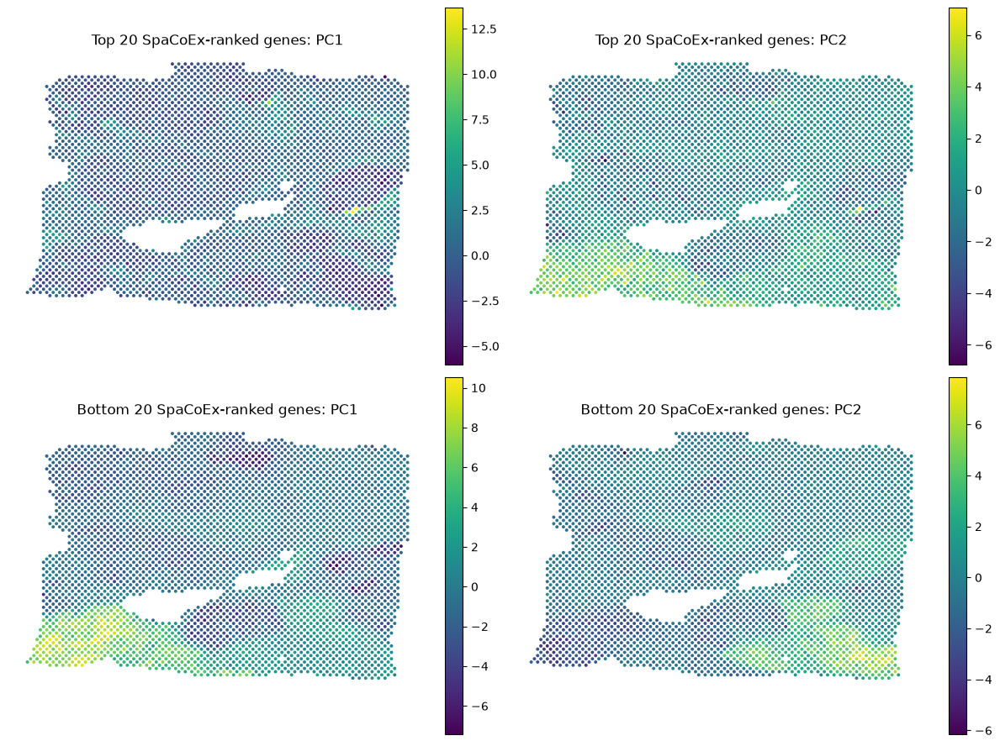

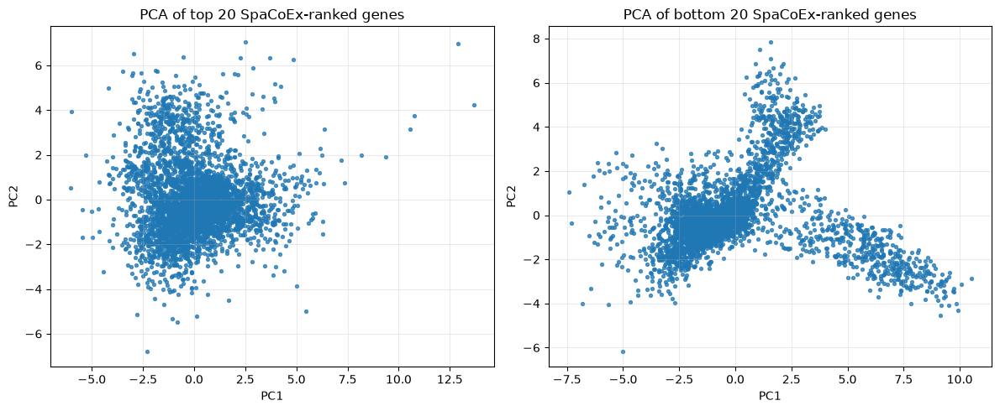

In [15]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

result = breast_corr_only

# 1. Get full SpaCoEx ranking of all input genes

full_spacoex_order = [
    g.strip()
    for g in result["path"].iloc[-1]["genes"].split(",")
]

rank_table = pd.DataFrame({
    "spacoex_rank": np.arange(1, len(full_spacoex_order) + 1),
    "gene": full_spacoex_order
})

display(rank_table)

print("Total ranked genes:", len(full_spacoex_order))

top20_genes = full_spacoex_order[:20]
bottom20_genes = full_spacoex_order[-20:]

print("\nTOP 20 SpaCoEx-ranked genes:")
print(top20_genes)

print("\nBOTTOM 20 SpaCoEx-ranked genes:")
print(bottom20_genes)

# 2. PCA helper

def run_expression_pca(ad, genes, label, n_components=5):
    genes = [g for g in genes if g in ad.var_names]

    if len(genes) < 2:
        raise ValueError(f"{label} has fewer than 2 genes available.")

    ad_sub = ad[:, genes].copy()
    X_sub = dense(ad_sub)

    X_scaled = StandardScaler().fit_transform(X_sub)

    n_components = min(
        n_components,
        X_scaled.shape[0] - 1,
        X_scaled.shape[1]
    )

    pca = PCA(
        n_components=n_components,
        random_state=RANDOM_STATE
    )

    scores = pca.fit_transform(X_scaled)

    explained = pd.DataFrame({
        "PC": [f"PC{i+1}" for i in range(n_components)],
        "explained_variance_ratio": pca.explained_variance_ratio_,
        "cumulative_explained_variance": np.cumsum(pca.explained_variance_ratio_)
    })

    score_df = pd.DataFrame(
        scores,
        index=ad_sub.obs_names,
        columns=[f"{label}_PC{i+1}" for i in range(n_components)]
    )

    loading_df = pd.DataFrame(
        pca.components_.T,
        index=genes,
        columns=[f"{label}_PC{i+1}_loading" for i in range(n_components)]
    )

    return {
        "label": label,
        "genes": genes,
        "scores": scores,
        "score_df": score_df,
        "loading_df": loading_df,
        "explained": explained,
        "pca": pca
    }

plot_ad = adata.copy()
plot_ad.var_names_make_unique()

top20_pca = run_expression_pca(
    plot_ad,
    top20_genes,
    label="Top20"
)

bottom20_pca = run_expression_pca(
    plot_ad,
    bottom20_genes,
    label="Bottom20"
)

print("\nTop 20 PCA explained variance:")
display(top20_pca["explained"])

print("\nBottom 20 PCA explained variance:")
display(bottom20_pca["explained"])

print("\nTop 20 PCA loadings:")
display(top20_pca["loading_df"])

print("\nBottom 20 PCA loadings:")
display(bottom20_pca["loading_df"])


x = plot_ad.obs["col"].astype(float).to_numpy()
y = -plot_ad.obs["row"].astype(float).to_numpy()

def spatial_continuous(ax, values, title, cmap="viridis"):
    sca = ax.scatter(
        x,
        y,
        c=values,
        cmap=cmap,
        s=8,
        linewidths=0
    )
    ax.set_title(title)
    ax.set_aspect("equal")
    ax.axis("off")
    plt.colorbar(sca, ax=ax, fraction=0.046, pad=0.04)

fig, axes = plt.subplots(2, 2, figsize=(12, 9))

spatial_continuous(
    axes[0, 0],
    top20_pca["scores"][:, 0],
    "Top 20 SpaCoEx-ranked genes: PC1"
)

spatial_continuous(
    axes[0, 1],
    top20_pca["scores"][:, 1],
    "Top 20 SpaCoEx-ranked genes: PC2"
)

spatial_continuous(
    axes[1, 0],
    bottom20_pca["scores"][:, 0],
    "Bottom 20 SpaCoEx-ranked genes: PC1"
)

spatial_continuous(
    axes[1, 1],
    bottom20_pca["scores"][:, 1],
    "Bottom 20 SpaCoEx-ranked genes: PC2"
)

plt.tight_layout()
plt.show()


fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].scatter(
    top20_pca["scores"][:, 0],
    top20_pca["scores"][:, 1],
    s=8,
    alpha=0.75
)
axes[0].set_xlabel("PC1")
axes[0].set_ylabel("PC2")
axes[0].set_title("PCA of top 20 SpaCoEx-ranked genes")
axes[0].grid(alpha=0.25)

axes[1].scatter(
    bottom20_pca["scores"][:, 0],
    bottom20_pca["scores"][:, 1],
    s=8,
    alpha=0.75
)
axes[1].set_xlabel("PC1")
axes[1].set_ylabel("PC2")
axes[1].set_title("PCA of bottom 20 SpaCoEx-ranked genes")
axes[1].grid(alpha=0.25)

plt.tight_layout()
plt.show()

In [16]:
# ============================================================
# FUNCTION: PLOT LOCAL CORRELATION + INDIVIDUAL EXPRESSION
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import sparse

def plot_gene_pair_corr_and_expression(
    gene_a,
    gene_b,
    ad=None,
    n_neighbors=None,
    use_raw=False,
    point_size=8,
    corr_cmap="coolwarm",
    expr_cmap="viridis"
):
    """
    Plots:
    1. local correlation between gene_a and gene_b
    2. expression of gene_a
    3. expression of gene_b
    """

    if n_neighbors is None:
        n_neighbors = N_NEIGHBORS

    if ad is None:
        if use_raw:
            ad = adata_raw.copy()
        else:
            ad = adata.copy()

    ad = ad.copy()
    ad.var_names_make_unique()

    missing = [g for g in [gene_a, gene_b] if g not in ad.var_names]
    if missing:
        raise ValueError(f"Missing genes from AnnData: {missing}")

    if "row" not in ad.obs.columns or "col" not in ad.obs.columns:
        if {"array_row", "array_col"}.issubset(ad.obs.columns):
            ad.obs["row"] = ad.obs["array_row"].astype(float)
            ad.obs["col"] = ad.obs["array_col"].astype(float)
        else:
            raise ValueError("Could not find row/col or array_row/array_col coordinates.")

    ad_pair = ad[:, [gene_a, gene_b]].copy()
    X_pair = ad_pair.X

    if sparse.issparse(X_pair):
        X_pair = X_pair.toarray()

    X_pair = np.asarray(X_pair, dtype=float)
    X_pair[~np.isfinite(X_pair)] = 0.0

    expr_a = X_pair[:, 0]
    expr_b = X_pair[:, 1]

    nbr = neighbor_idx(ad_pair, n_neighbors=n_neighbors)

    local_corr_values = np.zeros(ad_pair.n_obs, dtype=float)

    for i, idx in enumerate(nbr):
        xa = X_pair[idx, 0]
        xb = X_pair[idx, 1]

        if np.std(xa) < 1e-12 or np.std(xb) < 1e-12:
            local_corr_values[i] = 0.0
        else:
            local_corr_values[i] = np.corrcoef(xa, xb)[0, 1]

    local_corr_values[~np.isfinite(local_corr_values)] = 0.0

    x = ad_pair.obs["col"].astype(float).to_numpy()
    y = -ad_pair.obs["row"].astype(float).to_numpy()

    fig, axes = plt.subplots(1, 3, figsize=(15, 4.8))

    sca0 = axes[0].scatter(
        x,
        y,
        c=local_corr_values,
        cmap=corr_cmap,
        vmin=-1,
        vmax=1,
        s=point_size,
        linewidths=0
    )
    axes[0].set_title(f"Local correlation\n{gene_a} vs {gene_b}")
    axes[0].set_aspect("equal")
    axes[0].axis("off")
    fig.colorbar(sca0, ax=axes[0], fraction=0.046, pad=0.04)

    sca1 = axes[1].scatter(
        x,
        y,
        c=expr_a,
        cmap=expr_cmap,
        s=point_size,
        linewidths=0
    )
    axes[1].set_title(f"{gene_a} expression")
    axes[1].set_aspect("equal")
    axes[1].axis("off")
    fig.colorbar(sca1, ax=axes[1], fraction=0.046, pad=0.04)

    sca2 = axes[2].scatter(
        x,
        y,
        c=expr_b,
        cmap=expr_cmap,
        s=point_size,
        linewidths=0
    )
    axes[2].set_title(f"{gene_b} expression")
    axes[2].set_aspect("equal")
    axes[2].axis("off")
    fig.colorbar(sca2, ax=axes[2], fraction=0.046, pad=0.04)

    fig.suptitle(f"{gene_a} and {gene_b}", fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()

    summary = {
        "gene_a": gene_a,
        "gene_b": gene_b,
        "n_spots": ad_pair.n_obs,
        "mean_local_corr": float(np.mean(local_corr_values)),
        "sd_local_corr": float(np.std(local_corr_values)),
        "min_local_corr": float(np.min(local_corr_values)),
        "max_local_corr": float(np.max(local_corr_values)),
        f"{gene_a}_mean_expression": float(np.mean(expr_a)),
        f"{gene_b}_mean_expression": float(np.mean(expr_b)),
        f"{gene_a}_nonzero_spots": int(np.sum(expr_a > 0)),
        f"{gene_b}_nonzero_spots": int(np.sum(expr_b > 0)),
        "n_corr_exactly_1": int(np.sum(local_corr_values == 1.0)),
        "n_corr_exactly_minus_1": int(np.sum(local_corr_values == -1.0)),
        "n_corr_close_to_1": int(np.sum(np.isclose(local_corr_values, 1.0, atol=1e-12))),
        "n_corr_close_to_minus_1": int(np.sum(np.isclose(local_corr_values, -1.0, atol=1e-12))),
    }

    display(pd.DataFrame([summary]))

    return {
        "local_corr": local_corr_values,
        "expression_gene_a": expr_a,
        "expression_gene_b": expr_b,
        "summary": summary
    }

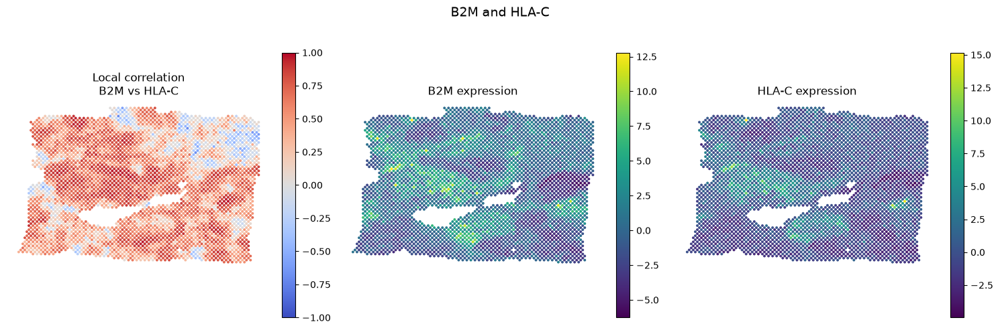

,gene_a,gene_b,n_spots,mean_local_corr,sd_local_corr,min_local_corr,max_local_corr,B2M_mean_expression,HLA-C_mean_expression,B2M_nonzero_spots,HLA-C_nonzero_spots,n_corr_exactly_1,n_corr_exactly_minus_1,n_corr_close_to_1,n_corr_close_to_minus_1
0,B2M,HLA-C,3798,0.476783,0.33466,-0.714893,0.981827,0.259685,0.04139,1826,1619,0,0,0,0


In [17]:

cartpt_krt5_corr = plot_gene_pair_corr_and_expression(
    "B2M",
    "HLA-C",
    use_raw=False
)

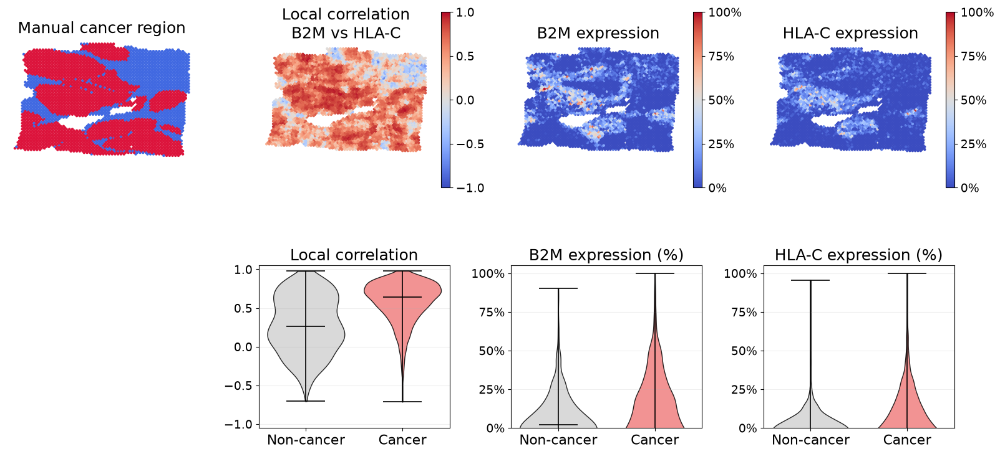

,feature,mean_cancer,mean_noncancer,median_cancer,median_noncancer,difference_cancer_minus_noncancer,mannwhitney_statistic,mannwhitney_p
0,Local correlation,0.580428,0.279476,0.641520,0.263148,0.300952,2410376.0,5.692917e-131
1,B2M expression (%),0.743896,4.479763,-4.122537,1.879360,-3.735868,1333707.5,4.339345e-20
2,HLA-C expression (%),0.368198,0.091253,-3.554600,-1.060150,0.276945,1466546.5,4.598167e-07


In [18]:
# ============================================================
# COMBINED CANCER MAP + CORRELATION/EXPRESSION MAPS + VIOLINS
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy import sparse
from scipy.stats import mannwhitneyu
from matplotlib.colors import ListedColormap


def plot_cancer_gene_pair_combined(
    gene_a="B2M",
    gene_b="HLA-C",
    ad=None,
    cancer_mode="strict",   # "strict" or "expanded"
    n_neighbors=None,
    point_size=10,
    figsize=(16, 8)
):
    if ad is None:
        ad = adata.copy()

    if n_neighbors is None:
        n_neighbors = N_NEIGHBORS

    ad = ad.copy()
    ad.var_names_make_unique()

    if "ground_truth" not in ad.obs.columns:
        raise ValueError("ad.obs['ground_truth'] not found.")

    missing = [g for g in [gene_a, gene_b] if g not in ad.var_names]
    if missing:
        raise ValueError(f"Missing genes from AnnData: {missing}")

    # --------------------------------------------------------
    # Cancer versus non-cancer annotation
    # --------------------------------------------------------

    fine_labels = ad.obs["ground_truth"].astype(str)

    if cancer_mode == "strict":
        cancer_mask = fine_labels.str.startswith(
            ("IDC", "DCIS/LCIS")
        ).to_numpy()

    elif cancer_mode == "expanded":
        cancer_mask = fine_labels.str.startswith(
            ("IDC", "DCIS/LCIS", "Tumor_edge")
        ).to_numpy()

    else:
        raise ValueError(
            "cancer_mode must be 'strict' or 'expanded'."
        )

    group = np.where(
        cancer_mask,
        "Cancer",
        "Non-cancer"
    )

    # --------------------------------------------------------
    # Extract expression
    # --------------------------------------------------------

    ad_pair = ad[:, [gene_a, gene_b]].copy()

    X_pair = (
        ad_pair.X.toarray()
        if sparse.issparse(ad_pair.X)
        else np.asarray(ad_pair.X)
    )

    X_pair = np.asarray(X_pair, dtype=float)
    X_pair[~np.isfinite(X_pair)] = 0.0

    expr_a = X_pair[:, 0]
    expr_b = X_pair[:, 1]

    def percent_of_maximum(values):
        values = np.asarray(values, dtype=float)
        maximum = np.nanmax(values)

        if not np.isfinite(maximum) or maximum <= 0:
            return np.zeros_like(values)

        return 100.0 * values / maximum

    expr_a_percent = percent_of_maximum(expr_a)
    expr_b_percent = percent_of_maximum(expr_b)

    # --------------------------------------------------------
    # Local correlation
    # --------------------------------------------------------

    nbr = neighbor_idx(
        ad_pair,
        n_neighbors=n_neighbors
    )

    local_corr = np.zeros(ad_pair.n_obs, dtype=float)

    for spot, indices in enumerate(nbr):
        xa = X_pair[indices, 0]
        xb = X_pair[indices, 1]

        if np.std(xa) < 1e-12 or np.std(xb) < 1e-12:
            local_corr[spot] = 0.0
        else:
            local_corr[spot] = np.corrcoef(xa, xb)[0, 1]

    local_corr[~np.isfinite(local_corr)] = 0.0

    # --------------------------------------------------------
    # Coordinates
    # --------------------------------------------------------

    if "row" not in ad_pair.obs or "col" not in ad_pair.obs:
        if {"array_row", "array_col"}.issubset(ad_pair.obs.columns):
            ad_pair.obs["row"] = (
                ad_pair.obs["array_row"].astype(float)
            )
            ad_pair.obs["col"] = (
                ad_pair.obs["array_col"].astype(float)
            )
        else:
            raise ValueError(
                "Could not find row/col or "
                "array_row/array_col coordinates."
            )

    x = ad_pair.obs["col"].astype(float).to_numpy()
    y = -ad_pair.obs["row"].astype(float).to_numpy()

    # --------------------------------------------------------
    # Data used by the violin plots
    # --------------------------------------------------------

    plot_df = pd.DataFrame({
        "group": group,
        "Local correlation": local_corr,
        f"{gene_a} expression (%)": expr_a_percent,
        f"{gene_b} expression (%)": expr_b_percent
    })

    violin_columns = [
        "Local correlation",
        f"{gene_a} expression (%)",
        f"{gene_b} expression (%)"
    ]

    # --------------------------------------------------------
    # Construct one 2 x 4 figure
    # --------------------------------------------------------

    fig, axes = plt.subplots(
        2,
        4,
        figsize=figsize,
        gridspec_kw={
            "height_ratios": [1.05, 0.85],
            "hspace": 0.36,
            "wspace": 0.32
        }
    )

    title_size = 18
    label_size = 16
    tick_size = 14

    # Top-left: binary cancer map
    binary_values = cancer_mask.astype(int)

    axes[0, 0].scatter(
        x,
        y,
        c=binary_values,
        cmap=ListedColormap(["royalblue", "crimson"]),
        vmin=0,
        vmax=1,
        s=point_size,
        linewidths=0
    )

    axes[0, 0].set_title(
        "Manual cancer region",
        fontsize=title_size
    )
    axes[0, 0].set_aspect("equal")
    axes[0, 0].axis("off")

    # Top-middle-left: local correlation
    scatter_corr = axes[0, 1].scatter(
        x,
        y,
        c=local_corr,
        cmap="coolwarm",
        vmin=-1,
        vmax=1,
        s=point_size,
        linewidths=0
    )

    axes[0, 1].set_title(
        f"Local correlation\n{gene_a} vs {gene_b}",
        fontsize=title_size
    )
    axes[0, 1].set_aspect("equal")
    axes[0, 1].axis("off")

    corr_colorbar = fig.colorbar(
        scatter_corr,
        ax=axes[0, 1],
        fraction=0.046,
        pad=0.04
    )
    corr_colorbar.ax.tick_params(labelsize=tick_size)

    # Top-right: relative expression maps
    expression_maps = [
        (gene_a, expr_a_percent),
        (gene_b, expr_b_percent)
    ]

    for ax, (gene, values) in zip(
        axes[0, 2:],
        expression_maps
    ):
        scatter_expr = ax.scatter(
            x,
            y,
            c=values,
            cmap="coolwarm",
            vmin=0,
            vmax=100,
            s=point_size,
            linewidths=0
        )

        ax.set_title(
            f"{gene} expression",
            fontsize=title_size
        )
        ax.set_aspect("equal")
        ax.axis("off")

        colorbar = fig.colorbar(
            scatter_expr,
            ax=ax,
            fraction=0.046,
            pad=0.04
        )

        colorbar.set_ticks([0, 25, 50, 75, 100])
        colorbar.set_ticklabels([
            "0%",
            "25%",
            "50%",
            "75%",
            "100%"
        ])
        colorbar.ax.tick_params(labelsize=tick_size)

    # Leave the bottom-left panel blank
    axes[1, 0].axis("off")

    # --------------------------------------------------------
    # Bottom row: violin plots
    # --------------------------------------------------------

    summary_rows = []

    for ax, column in zip(
        axes[1, 1:],
        violin_columns
    ):
        noncancer_values = plot_df.loc[
            plot_df["group"] == "Non-cancer",
            column
        ].to_numpy()

        cancer_values = plot_df.loc[
            plot_df["group"] == "Cancer",
            column
        ].to_numpy()

        parts = ax.violinplot(
            [noncancer_values, cancer_values],
            positions=[1, 2],
            widths=0.8,
            showmeans=False,
            showmedians=True,
            showextrema=True
        )

        for body, color in zip(
            parts["bodies"],
            ["lightgray", "lightcoral"]
        ):
            body.set_facecolor(color)
            body.set_edgecolor("black")
            body.set_alpha(0.85)

        for key in [
            "cmedians",
            "cbars",
            "cmins",
            "cmaxes"
        ]:
            if key in parts:
                parts[key].set_color("black")
                parts[key].set_linewidth(1.2)

        ax.set_xticks([1, 2])
        ax.set_xticklabels(
            ["Non-cancer", "Cancer"],
            rotation=0,
            ha="center",
            fontsize=label_size
        )

        ax.set_title(
            column,
            fontsize=title_size
        )

        ax.tick_params(
            axis="y",
            labelsize=tick_size
        )

        ax.grid(
            axis="y",
            alpha=0.2
        )

        if column == "Local correlation":
            ax.set_ylim(-1.05, 1.05)
        else:
            ax.set_ylim(0, 105)
            ax.set_yticks([0, 25, 50, 75, 100])
            ax.set_yticklabels(
                ["0%", "25%", "50%", "75%", "100%"],
                fontsize=tick_size
            )

        statistic, p_value = mannwhitneyu(
            cancer_values,
            noncancer_values,
            alternative="two-sided"
        )

        summary_rows.append({
            "feature": column,
            "mean_cancer": np.mean(cancer_values),
            "mean_noncancer": np.mean(noncancer_values),
            "median_cancer": np.median(cancer_values),
            "median_noncancer": np.median(noncancer_values),
            "difference_cancer_minus_noncancer":
                np.mean(cancer_values)
                - np.mean(noncancer_values),
            "mannwhitney_statistic": statistic,
            "mannwhitney_p": p_value
        })

    # No overall title
    fig.subplots_adjust(
        left=0.03,
        right=0.98,
        bottom=0.10,
        top=0.96
    )

    plt.show()

    summary = pd.DataFrame(summary_rows)
    display(summary)

    return {
        "plot_df": plot_df,
        "summary": summary,
        "cancer_mask": cancer_mask,
        "local_corr": local_corr,
        "expression_gene_a_percent": expr_a_percent,
        "expression_gene_b_percent": expr_b_percent
    }


combined_b2m_hlac = plot_cancer_gene_pair_combined(
    gene_a="B2M",
    gene_b="HLA-C",
    cancer_mode="strict",
    point_size=10,
    figsize=(16, 8)
)